In [120]:
import numpy as np
import json
from PIL import Image
import torch
import torchvision
from torchvision.transforms import functional as F
from torch.utils.data import DataLoader
from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval
from collections import defaultdict
from tqdm import tqdm
import xml.etree.ElementTree as ET
from torchmetrics.detection.mean_ap import MeanAveragePrecision

from torchvision.io.image import decode_image
from torchvision.utils import draw_bounding_boxes
from torchvision.transforms.functional import to_pil_image

In [2]:
print(torch.cuda.is_available())
print(torch.cuda.get_device_name(0))
print(torch.version.cuda)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

True
NVIDIA GeForce RTX 3050
12.4
Using device: cuda


# **Choosing and loading up 3 object detection models**

## **Faster R-CNN**

In [37]:
# from torchvision.models.detection import fasterrcnn_resnet50_fpn_v2, FasterRCNN_ResNet50_FPN_V2_Weights
from torchvision.models.detection import fasterrcnn_mobilenet_v3_large_fpn, FasterRCNN_MobileNet_V3_Large_FPN_Weights

rcnn_weights = FasterRCNN_MobileNet_V3_Large_FPN_Weights.DEFAULT
model_rcnn = fasterrcnn_mobilenet_v3_large_fpn(weights=rcnn_weights)
rcnn_preprocess_transform = rcnn_weights.transforms() # Recommended transforms for inference
print("Faster R-CNN MobileNetV3 FPN model loaded with default weights (recommended).")

model_rcnn.to(device)
model_rcnn.eval()

print("\nModel imported successfully and set to evaluation mode.")
print("Model architecture example (first few layers):")
print(model_rcnn)

Faster R-CNN MobileNetV3 FPN model loaded with default weights (recommended).

Model imported successfully and set to evaluation mode.
Model architecture example (first few layers):
FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (0): Conv2dNormActivation(
        (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (1): FrozenBatchNorm2d(16, eps=1e-05)
        (2): Hardswish()
      )
      (1): InvertedResidual(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=16, bias=False)
            (1): FrozenBatchNorm2d(16, eps=1e-05)
            (2): ReLU(inplace=True)
          )
          (1): Conv2dNormActivation(
            (0): Conv2

## **YOLO v8**

In [3]:
# Import the YOLO class from ultralytics
from ultralytics import YOLO

# Load a pre-trained YOLOv8 model
# You can choose different versions: 'yolov8n.pt' (nano), 'yolov8s.pt' (small), 'yolov8m.pt' (medium), 'yolov8l.pt' (large), 'yolov8x.pt' (extra large)
# 'yolov8n.pt' is the smallest and fastest, good for quick testing.
# The .load() method automatically downloads the weights if they are not already cached.
print("\nLoading pre-trained YOLOv8m model...")
model_yolo = YOLO('yolov8m.pt') # Loads YOLOv8 Medium model weights
print("YOLOv8m model loaded successfully.")
print("Model info:")
model_yolo.info() # Prints details about the model architecture and parameters


Loading pre-trained YOLOv8m model...
YOLOv8m model loaded successfully.
Model info:
YOLOv8m summary: 169 layers, 25,902,640 parameters, 0 gradients, 79.3 GFLOPs


(169, 25902640, 0, 79.3204224)

## **SSDLite**

In [85]:
# from torchvision.models.detection import fasterrcnn_resnet50_fpn_v2, FasterRCNN_ResNet50_FPN_V2_Weights
from torchvision.models.detection import ssdlite320_mobilenet_v3_large, SSDLite320_MobileNet_V3_Large_Weights

ssd_weights = SSDLite320_MobileNet_V3_Large_Weights.DEFAULT
model_ssd = ssdlite320_mobilenet_v3_large(weights=ssd_weights)
ssd_preprocess_transform = ssd_weights.transforms() # Recommended transforms for inference
print("SSDLite320 MobileNetV3 model loaded with default weights.")

model_ssd.to(device)
model_ssd.eval()

print("\nModel imported successfully and set to evaluation mode.")
print("Model architecture example (first few layers):")
print(model_ssd)

SSDLite320 MobileNetV3 model loaded with default weights.

Model imported successfully and set to evaluation mode.
Model architecture example (first few layers):
SSD(
  (backbone): SSDLiteFeatureExtractorMobileNet(
    (features): Sequential(
      (0): Sequential(
        (0): Conv2dNormActivation(
          (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
          (1): BatchNorm2d(16, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
          (2): Hardswish()
        )
        (1): InvertedResidual(
          (block): Sequential(
            (0): Conv2dNormActivation(
              (0): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=16, bias=False)
              (1): BatchNorm2d(16, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
              (2): ReLU(inplace=True)
            )
            (1): Conv2dNormActivation(
              (0): Conv2d(16, 16, kernel_size=(1, 1), stride=(1, 1), bias=

# **COCO 2017 Validation Set**

## Loading Dataset

In [4]:
# 2. Define the base path to your datasets folder on Google Drive
base_dataset_dir = r'C:\Users\pc\Desktop\Term 10\Computer Vision\Assignment 4 Part 2\datasets'

# --- COCO 2017 Validation Dataset ---
print("Loading COCO 2017 Validation Dataset...")
coco_val_image_dir = f"{base_dataset_dir}/coco_2017/images/val2017"
coco_val_ann_file = f"{base_dataset_dir}/coco_2017/annotations/instances_val2017.json"

# Initialize the COCO dataset
coco_val_dataset = torchvision.datasets.CocoDetection(
    root=coco_val_image_dir,
    annFile=coco_val_ann_file,
)

print(f"Number of images in COCO 2017 Validation Dataset: {len(coco_val_dataset)}")
print("COCO dataset loaded.\n")

Loading COCO 2017 Validation Dataset...
loading annotations into memory...
Done (t=0.44s)
creating index...
index created!
Number of images in COCO 2017 Validation Dataset: 5000
COCO dataset loaded.



## Creating Dataloader

In [5]:
# Define Custom Collate Function for Object Detection
# This function is crucial because images in a batch can have different numbers of bounding boxes.
# The default collate_fn in PyTorch's DataLoader cannot handle this.
def detection_collate_fn(batch):
    """
    Custom collate function to handle variable number of targets (bounding boxes) per image.
    It separates images and targets into two lists.
    """
    images = []
    targets = [] # Each item in targets will be a list of dictionaries (one dict per object)
    for img, target in batch:
        images.append(img)
        targets.append(target)
    return images, targets

# Create DataLoader
print("\nCreating DataLoader...")

coco_val_dataloader = DataLoader(
    coco_val_dataset,
    batch_size=4,
    shuffle=False, # No need to shuffle for validation/testing
    num_workers=0,
    collate_fn=detection_collate_fn
)


print("DataLoader created successfully.")
print(f"COCO DataLoader batch size: {coco_val_dataloader.batch_size}")


Creating DataLoader...
DataLoader created successfully.
COCO DataLoader batch size: 4


# **Inference of 3 Models**

## Faster RCNN Inference

In [71]:
# --- Inference Function for Faster R-CNN ---
def run_inference_faster_rcnn(model, dataloader, device, score_threshold=0.5, is_voc=False):
    """
    Runs inference for Faster R-CNN model on a given dataloader.

    Args:
        model: The loaded Faster R-CNN model.
        dataloader: DataLoader for the dataset (e.g., COCO val, VOC test).
        device: The device (cuda or cpu) the model is on.
        score_threshold: Confidence threshold to filter predictions.

    Returns:
        A list of dictionaries, where each dictionary contains predictions for one image:
        {'image_id': int, 'boxes': np.array, 'labels': np.array, 'scores': np.array}
        Boxes are in [x1, y1, x2, y2] format and original image scale.
    """
    model.eval() # Set model to evaluation mode
    all_predictions_low_threshold = []
    all_predictions_chosen_threshold = []
    all_predictions_high_threshold = []

    
    
    print(f"\nStarting inference for Faster R-CNN on {len(dataloader.dataset)} images...")
    with torch.no_grad(): # Disable gradient calculation for inference (saves memory, speeds up)
        for batch_idx, (images, targets) in enumerate(dataloader):
            # Preprocess images:
            processed_images = [rcnn_preprocess_transform(img).to(device) for img in images]
            # Run inference
            outputs = model(processed_images) # outputs is a list of dicts (one per image in batch)
            # # Extract the image ids from dataloader
            # current_batch_image_ids = []
            # for img_in_batch_idx in range(len(images)): # Iterate over images in the current batch
            #     dataset_original_idx = batch_idx * dataloader.batch_size + img_in_batch_idx
            #     # This ensures we get the actual COCO image_id corresponding to the image at this position in the batch
            #     current_batch_image_ids.append(dataloader.dataset.ids[dataset_original_idx])
            # --- Extract the correct image_id based on `is_voc` flag ---
            current_batch_image_ids = []
            for i_in_batch in range(len(images)):
                if is_voc:
                    # For VOC, targets_batch[i_in_batch] is the XML annotation dict for that image
                    # We need to extract the filename from the XML root
                    image_id = targets[i_in_batch]['annotation']['filename'].split('.')[0]
                else: # Assume COCO dataset
                    # For COCO, targets_batch[i_in_batch] is the COCO target dict for that image
                    dataset_original_idx = batch_idx * dataloader.batch_size + i_in_batch
                    # This ensures we get the actual COCO image_id (int) corresponding to the image
                    image_id = dataloader.dataset.ids[dataset_original_idx]
                current_batch_image_ids.append(image_id)
            # Post-process outputs
            for i, output in enumerate(outputs):
                # Filter by score threshold
                keep_low = output['scores'] > 0.01
                keep_chosen = output['scores'] > score_threshold
                keep_high = output['scores'] > 0.80
                # Get image_id from ground truth targets
                # The targets list contains one element (a list of dicts) for each image in batch_size=1.
                # The actual image_id is in targets[i][0]['image_id']
                # image_id = targets[i][0]['image_id'] if targets[i] else -999 # Fallback if no targets
                image_id = current_batch_image_ids[i]
                # Get predictions
                boxes = output['boxes'][keep_low].cpu().numpy()
                labels = output['labels'][keep_low].cpu().numpy()
                scores = output['scores'][keep_low].cpu().numpy()

                all_predictions_low_threshold.append({
                    'image_id': image_id,
                    'boxes': boxes,
                    'labels': labels,
                    'scores': scores
                })

                boxes = output['boxes'][keep_chosen].cpu().numpy()
                labels = output['labels'][keep_chosen].cpu().numpy()
                scores = output['scores'][keep_chosen].cpu().numpy()
                all_predictions_chosen_threshold.append({
                    'image_id': image_id,
                    'boxes': boxes,
                    'labels': labels,
                    'scores': scores
                })
                boxes = output['boxes'][keep_high].cpu().numpy()
                labels = output['labels'][keep_high].cpu().numpy()
                scores = output['scores'][keep_high].cpu().numpy()
                all_predictions_high_threshold.append({
                    'image_id': image_id,
                    'boxes': boxes,
                    'labels': labels,
                    'scores': scores
                })
            # print(f"Finished batch {batch_idx + 1}")
            if (batch_idx + 1) % 100 == 0:
                print(f"Processed {batch_idx + 1}/{len(dataloader)} batches...")
            # if batch_idx == 10:
            #     break

    print(f"Inference for Faster R-CNN complete. Total predictions: {len(all_predictions_low_threshold)}")
    return all_predictions_low_threshold, all_predictions_chosen_threshold, all_predictions_high_threshold

Time for inference: (4 images per batch, local gpu) about 40 seconds - 60 seconds per patch (about 10 minutes)

In [39]:
print("--- Running Faster R-CNN on COCO Validation Set ---")
rcnn_coco_predictions_low_score, rcnn_coco_predictions_chosen_score, rcnn_coco_predictions_high_score = run_inference_faster_rcnn(model_rcnn, coco_val_dataloader, device)

--- Running Faster R-CNN on COCO Validation Set ---

Starting inference for Faster R-CNN on 5000 images...
Processed 100/1250 batches...
Processed 200/1250 batches...
Processed 300/1250 batches...
Processed 400/1250 batches...
Processed 500/1250 batches...
Processed 600/1250 batches...
Processed 700/1250 batches...
Processed 800/1250 batches...
Processed 900/1250 batches...
Processed 1000/1250 batches...
Processed 1100/1250 batches...
Processed 1200/1250 batches...
Inference for Faster R-CNN complete. Total predictions: 5000


5 minutes 20 seconds

In [72]:
print("--- Running Faster R-CNN on VOC Test Set ---")
rcnn_voc_predictions_low_score, rcnn_voc_predictions_chosen_score, rcnn_voc_predictions_high_score = run_inference_faster_rcnn(model_rcnn, voc_test_dataloader, device, is_voc = True)

--- Running Faster R-CNN on VOC Test Set ---

Starting inference for Faster R-CNN on 4952 images...
Processed 100/1238 batches...
Processed 200/1238 batches...
Processed 300/1238 batches...
Processed 400/1238 batches...
Processed 500/1238 batches...
Processed 600/1238 batches...
Processed 700/1238 batches...
Processed 800/1238 batches...
Processed 900/1238 batches...
Processed 1000/1238 batches...
Processed 1100/1238 batches...
Processed 1200/1238 batches...
Inference for Faster R-CNN complete. Total predictions: 4952


## YOLOv8 Inference

In [152]:
def run_inference_yolov8(model, dataloader, device, score_threshold=0.5, iou_threshold=0.7, is_voc = False):
    """
    Runs inference for YOLOv8 model on a given dataloader.

    Args:
        model: The loaded YOLOv8 model (ultralytics.YOLO object).
        dataloader: DataLoader for the dataset.
        device: The device (cuda or cpu) the model is on.
        score_threshold: Confidence threshold to filter predictions (conf argument for YOLO).
        iou_threshold: IoU threshold for Non-Maximum Suppression (iou argument for YOLO).

    Returns:
        A list of dictionaries, where each dictionary contains predictions for one image:
        {'image_id': int, 'boxes': np.array, 'labels': np.array, 'scores': np.array}
        Boxes are in [x1, y1, x2, y2] format and original image scale.
    """
    # YOLOv8's predict method handles moving model to device and eval mode internally.
    # It also handles preprocessing and NMS internally.

    all_predictions_low_threshold = []
    all_predictions_chosen_threshold = []
    all_predictions_high_threshold = []

    print(f"\nStarting inference for YOLOv8 on {len(dataloader.dataset)} images...")

    # --- FIX: Iterate over the DataLoader directly for batching ---
    for batch_idx, (images, targets) in enumerate(dataloader):
        # Get image ids
        # current_batch_image_ids = []
        # for img_in_batch_idx in range(len(images)): # Loop through each image in the current batch
        #     dataset_original_idx = batch_idx * dataloader.batch_size + img_in_batch_idx
        #     current_batch_image_ids.append(all_coco_image_ids_ordered[dataset_original_idx])
            
        # # Extract the image ids from dataloader
        # current_batch_image_ids = []
        # for img_in_batch_idx in range(len(images)): # Iterate over images in the current batch
        #     dataset_original_idx = batch_idx * dataloader.batch_size + img_in_batch_idx
        #     # This ensures we get the actual COCO image_id corresponding to the image at this position in the batch
        #     current_batch_image_ids.append(dataloader.dataset.ids[dataset_original_idx])

     # --- Extract the correct image_id based on `is_voc` flag ---
        current_batch_image_ids = []
        for i_in_batch in range(len(images)):
            if is_voc:
                # For VOC, targets_batch[i_in_batch] is the XML annotation dict for that image
                # We need to extract the filename from the XML root
                image_id = targets[i_in_batch]['annotation']['filename'].split('.')[0]
                # print(f"{image_id} of type {type(image_id)}")
            else: # Assume COCO dataset
                # For COCO, targets_batch[i_in_batch] is the COCO target dict for that image
                dataset_original_idx = batch_idx * dataloader.batch_size + i_in_batch
                # This ensures we get the actual COCO image_id (int) corresponding to the image
                image_id = dataloader.dataset.ids[dataset_original_idx]
            current_batch_image_ids.append(image_id)
    
        results_list = model.predict(
            source=images,
            conf=0.01,     # Using 0.01 for the 'low_threshold' output
            iou=iou_threshold, # Use the provided iou_threshold for NMS
            device=device,
            verbose=False,
        )

        # Process the results (results_list contains one Results object per image in the batch)
        # Each results_obj in results_list corresponds to an image in the current batch.
        for i, results_obj in enumerate(results_list):
            image_id = current_batch_image_ids[i] # Use the correct COCO image_id

            # Extract raw detections for this image
            # No need to manually apply score_threshold here for low_threshold predictions
            # as conf=0.01 already did that.
            boxes_all = results_obj.boxes.xyxy.cpu().numpy()
            scores_all = results_obj.boxes.conf.cpu().numpy()
            labels_all = results_obj.boxes.cls.cpu().numpy().astype(int)

            all_predictions_low_threshold.append({
                'image_id': image_id,
                'boxes': boxes_all,
                'labels': labels_all,
                'scores': scores_all
            })

            # Threshold chosen_threshold (from function argument)
            keep_chosen = scores_all > score_threshold
            all_predictions_chosen_threshold.append({
                'image_id': image_id,
                'boxes': boxes_all[keep_chosen],
                'labels': labels_all[keep_chosen],
                'scores': scores_all[keep_chosen]
            })

            # Threshold 0.80
            keep_high = scores_all > 0.80
            all_predictions_high_threshold.append({
                'image_id': image_id,
                'boxes': boxes_all[keep_high],
                'labels': labels_all[keep_high],
                'scores': scores_all[keep_high]
            })

        if (batch_idx + 1) % 100 == 0:
            print(f"Processed {batch_idx + 1}/{len(dataloader)} batches...")
        # if batch_idx == 10:
        #     break

    print(f"Inference for YOLOv8 complete. Total predictions: {len(all_predictions_low_threshold)}")
    return all_predictions_low_threshold, all_predictions_chosen_threshold, all_predictions_high_threshold

Took about 3 minutes

In [18]:
print("--- Running YOLOv8 on COCO Validation Set ---")
yolo_coco_predictions_low_score, yolo_coco_predictions_chosen_score, yolo_coco_predictions_high_score = run_inference_yolov8(model_yolo, coco_val_dataloader, device)

--- Running YOLOv8 on COCO Validation Set ---

Starting inference for YOLOv8 on 5000 images...
Processed 100/1250 batches...
Processed 200/1250 batches...
Processed 300/1250 batches...
Processed 400/1250 batches...
Processed 500/1250 batches...
Processed 600/1250 batches...
Processed 700/1250 batches...
Processed 800/1250 batches...
Processed 900/1250 batches...
Processed 1000/1250 batches...
Processed 1100/1250 batches...
Processed 1200/1250 batches...
Inference for YOLOv8 complete. Total predictions: 5000


2 minutes 40 seconds

In [153]:
print("--- Running YOLOv8 on VOC Test Set ---")
yolo_voc_predictions_low_score, yolo_voc_predictions_chosen_score, yolo_voc_predictions_high_score = run_inference_yolov8(model_yolo, voc_test_dataloader, device, is_voc = True)

--- Running YOLOv8 on VOC Test Set ---

Starting inference for YOLOv8 on 4952 images...
Processed 100/1238 batches...
Processed 200/1238 batches...
Processed 300/1238 batches...
Processed 400/1238 batches...
Processed 500/1238 batches...
Processed 600/1238 batches...
Processed 700/1238 batches...
Processed 800/1238 batches...
Processed 900/1238 batches...
Processed 1000/1238 batches...
Processed 1100/1238 batches...
Processed 1200/1238 batches...
Inference for YOLOv8 complete. Total predictions: 4952


## SSDLite Inference

In [77]:
# --- Inference Function for Faster R-CNN ---
def run_inference_ssd(model, dataloader, device, score_threshold=0.5, is_voc = False):
    model.eval() # Set model to evaluation mode
    all_predictions_low_threshold = []
    all_predictions_chosen_threshold = []
    all_predictions_high_threshold = []

    print(f"\nStarting inference for SSDLite on {len(dataloader.dataset)} images...")
    with torch.no_grad(): # Disable gradient calculation for inference (saves memory, speeds up)
        for batch_idx, (images, targets) in enumerate(dataloader):
            # Preprocess images:
            processed_images = [ssd_preprocess_transform(img).to(device) for img in images]
            # Run inference
            outputs = model(processed_images) # outputs is a list of dicts (one per image in batch)
            # # Extract the image ids from dataloader
            # current_batch_image_ids = []
            # for img_in_batch_idx in range(len(images)): # Iterate over images in the current batch
            #     dataset_original_idx = batch_idx * dataloader.batch_size + img_in_batch_idx
            #     # This ensures we get the actual COCO image_id corresponding to the image at this position in the batch
            #     current_batch_image_ids.append(dataloader.dataset.ids[dataset_original_idx])

            # --- Extract the correct image_id based on `is_voc` flag ---
            current_batch_image_ids = []
            for i_in_batch in range(len(images)):
                if is_voc:
                    # For VOC, targets_batch[i_in_batch] is the XML annotation dict for that image
                    # We need to extract the filename from the XML root
                    image_id = targets[i_in_batch]['annotation']['filename'].split('.')[0]
                else: # Assume COCO dataset
                    # For COCO, targets_batch[i_in_batch] is the COCO target dict for that image
                    dataset_original_idx = batch_idx * dataloader.batch_size + i_in_batch
                    # This ensures we get the actual COCO image_id (int) corresponding to the image
                    image_id = dataloader.dataset.ids[dataset_original_idx]
                current_batch_image_ids.append(image_id)
    
            # Post-process outputs
            for i, output in enumerate(outputs):
                # Filter by score threshold
                keep_low = output['scores'] > 0.01
                keep_chosen = output['scores'] > score_threshold
                keep_high = output['scores'] > 0.80
                # Get image_id from ground truth targets
                # The targets list contains one element (a list of dicts) for each image in batch_size=1.
                # The actual image_id is in targets[i][0]['image_id']
                # image_id = targets[i][0]['image_id'] if targets[i] else -999 # Fallback if no targets
                image_id = current_batch_image_ids[i]
                # Get predictions
                boxes = output['boxes'][keep_low].cpu().numpy()
                labels = output['labels'][keep_low].cpu().numpy()
                scores = output['scores'][keep_low].cpu().numpy()

                all_predictions_low_threshold.append({
                    'image_id': image_id,
                    'boxes': boxes,
                    'labels': labels,
                    'scores': scores
                })

                boxes = output['boxes'][keep_chosen].cpu().numpy()
                labels = output['labels'][keep_chosen].cpu().numpy()
                scores = output['scores'][keep_chosen].cpu().numpy()
                all_predictions_chosen_threshold.append({
                    'image_id': image_id,
                    'boxes': boxes,
                    'labels': labels,
                    'scores': scores
                })
                boxes = output['boxes'][keep_high].cpu().numpy()
                labels = output['labels'][keep_high].cpu().numpy()
                scores = output['scores'][keep_high].cpu().numpy()
                all_predictions_high_threshold.append({
                    'image_id': image_id,
                    'boxes': boxes,
                    'labels': labels,
                    'scores': scores
                })
            # print(f"Finished batch {batch_idx + 1}")
            if (batch_idx + 1) % 100 == 0:
                print(f"Processed {batch_idx + 1}/{len(dataloader)} batches...")

    print(f"Inference for SSDLite complete. Total predictions: {len(all_predictions_low_threshold)}")
    return all_predictions_low_threshold, all_predictions_chosen_threshold, all_predictions_high_threshold


Took About 6 minutes

In [9]:
print("--- Running SSDLite on COCO Validation Set ---")
ssd_coco_predictions_low_score, ssd_coco_predictions_chosen_score, ssd_coco_predictions_high_score = run_inference_ssd(model_ssd, coco_val_dataloader, device)

--- Running SSDLite on COCO Validation Set ---

Starting inference for SSDLite on 5000 images...
Processed 100/1250 batches...
Processed 200/1250 batches...
Processed 300/1250 batches...
Processed 400/1250 batches...
Processed 500/1250 batches...
Processed 600/1250 batches...
Processed 700/1250 batches...
Processed 800/1250 batches...
Processed 900/1250 batches...
Processed 1000/1250 batches...
Processed 1100/1250 batches...
Processed 1200/1250 batches...
Inference for SSDLite complete. Total predictions: 5000


6 minutes 25 seconds

In [86]:
print("--- Running SSDLite on VOC Test Set ---")
ssd_voc_predictions_low_score, ssd_voc_predictions_chosen_score, ssd_voc_predictions_high_score = run_inference_ssd(model_ssd, voc_test_dataloader, device, is_voc = True)

--- Running SSDLite on VOC Test Set ---

Starting inference for SSDLite on 4952 images...
Processed 100/1238 batches...
Processed 200/1238 batches...
Processed 300/1238 batches...
Processed 400/1238 batches...
Processed 500/1238 batches...
Processed 600/1238 batches...
Processed 700/1238 batches...
Processed 800/1238 batches...
Processed 900/1238 batches...
Processed 1000/1238 batches...
Processed 1100/1238 batches...
Processed 1200/1238 batches...
Inference for SSDLite complete. Total predictions: 4952


# **Evaluation**

## Create Functions for Evaluation

In [48]:
# Path to COCO validation annotations file (ground truth)
base_dataset_dir = r'C:\Users\pc\Desktop\Term 10\Computer Vision\Assignment 4 Part 2\datasets'
coco_val_ann_file = f"{base_dataset_dir}/coco_2017/annotations/instances_val2017.json"
coco_train_ann_file = f"{base_dataset_dir}/coco_2017/annotations/instances_train2017.json"

def convert_predictions_to_coco_json(predictions):
    """
    Converts model predictions (list of dicts) into the COCO JSON detection format.

    Args:
        predictions: A list of dictionaries from run_inference_... functions:
                     [{'image_id': int, 'boxes': np.array, 'labels': np.array, 'scores': np.array}, ...]
        coco_label_to_id_map: A list or dictionary mapping model output labels (e.g., 0-79)
                              to official COCO category IDs.

    Returns:
        A list of dictionaries in COCO detection JSON format.
    """
    coco_detections = []
    for pred_per_image in predictions:
        image_id = pred_per_image['image_id']
        boxes = pred_per_image['boxes'] # [x1, y1, x2, y2]
        labels = pred_per_image['labels']
        scores = pred_per_image['scores']

        for bbox, label, score in zip(boxes, labels, scores):
            # Convert [x1, y1, x2, y2] to [x, y, width, height]
            x1, y1, x2, y2 = bbox
            width = x2 - x1
            height = y2 - y1
            coco_detections.append({
                "image_id": int(image_id),
                "category_id": int(label),
                "bbox": [float(x1), float(y1), float(width), float(height)],
                "score": float(score)
            })
    return coco_detections


In [49]:
# --- 3. Function to Run COCO Evaluation ---
def evaluate_coco(predictions_in_coco_format, ground_truth_ann_file):
    """
    Performs COCO evaluation (mAP, IoU etc.) using pycocotools.

    Args:
        predictions_in_coco_format: List of dictionaries in COCO detection JSON format.
        ground_truth_ann_file: Path to the COCO ground truth annotation JSON file.

    Returns:
        A dictionary containing the COCO evaluation summary.
    """
    print(f"\nStarting COCO evaluation...")
    coco_gt = COCO(ground_truth_ann_file) # Load ground truth annotations
    gt_img_ids = coco_gt.getImgIds()
    coco_dt = coco_gt.loadRes(predictions_in_coco_format) # Load your model's predictions
    # Initialize COCOeval
    # 'bbox' indicates object detection (as opposed to 'segm' for segmentation)
    coco_eval = COCOeval(coco_gt, coco_dt, 'bbox')
    coco_eval.params.imgIds = gt_img_ids # This explicitly tells COCOeval to evaluate on ALL GT images
    # Perform evaluation
    coco_eval.evaluate()
    coco_eval.accumulate()
    coco_eval.summarize() # Prints the mAP and other metrics to console

    # You can also extract specific metrics if needed
    stats = coco_eval.stats # This is a numpy array of 12 numbers.
                            # stats[0] is mAP@IoU=0.5:0.95
                            # stats[1] is mAP@IoU=0.5
                            # and so on. Refer to COCOeval documentation for full details.
    return stats

## Faster RCNN Evaluation

In [52]:
coco_det_rcnn_chosen = convert_predictions_to_coco_json(rcnn_coco_predictions_chosen_score)
rcnn_stats = evaluate_coco(coco_det_rcnn_chosen, coco_val_ann_file)
print(f"Faster R-CNN mAP (IoU=0.5:0.95): {rcnn_stats[0]:.3f}")


Starting COCO evaluation...
loading annotations into memory...
Done (t=0.45s)
creating index...
index created!
1
Loading and preparing results...
DONE (t=0.08s)
creating index...
index created!
1
1
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=8.96s).
Accumulating evaluation results...
DONE (t=1.59s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.297
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.456
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.320
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.095
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.328
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.471
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.253
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.348
 Average Recall     (AR) @[ Io

In [54]:
coco_det_rcnn_low = convert_predictions_to_coco_json(rcnn_coco_predictions_low_score)
rcnn_stats = evaluate_coco(coco_det_low, coco_val_ann_file)
print(f"Faster R-CNN mAP (IoU=0.5:0.95): {rcnn_stats[0]:.3f}")


Starting COCO evaluation...
loading annotations into memory...
Done (t=0.38s)
creating index...
index created!
1
Loading and preparing results...
DONE (t=0.48s)
creating index...
index created!
1
1
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=19.64s).
Accumulating evaluation results...
DONE (t=3.19s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.327
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.524
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.342
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.127
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.363
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.499
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.285
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.427
 Average Recall     (AR) @[ I

## YOLOv8 Evaluation

In [15]:
# --- 1. Load the COCO ground truth for definitive COCO ID to Name mapping ---
coco_gt_eval = COCO(coco_val_ann_file)
# Create a map from COCO category ID to Name (e.g., {1: 'person', 2: 'bicycle', ...})
coco_id_to_name_map = {cat['id']: cat['name'] for cat in coco_gt_eval.loadCats(coco_gt_eval.getCatIds())}
# Create a map from COCO category Name to ID (e.g., {'person': 1, 'bicycle': 2, ...})
coco_name_to_id_map = {cat['name']: cat['id'] for cat in coco_gt_eval.loadCats(coco_gt_eval.getCatIds())}


# --- 2. Define the YOLOv8 internal labels to names mapping (from your YAML) ---
# This is equivalent to `model_yolo.names` if you loaded the model.
yolov8_label_to_name_map = model_yolo.names
# --- 3. Create the definitive YOLO_Label to COCO_ID mapping list/dict ---
# This is the actual map you will pass to convert_predictions_to_coco_json
yolo_label_to_coco_id_mapper = {}
for yolo_label, class_name in yolov8_label_to_name_map.items():
    if class_name in coco_name_to_id_map:
        yolo_label_to_coco_id_mapper[yolo_label] = coco_name_to_id_map[class_name]
    else:
        # This case handles if a YOLO class name somehow doesn't exist in COCO
        # (highly unlikely for pre-trained YOLOv8 on COCO).
        # You might also map it to a specific "unknown" ID or skip if necessary.
        print(f"Warning: Class '{class_name}' (YOLO label {yolo_label}) not found in COCO categories. Will be skipped.")
        yolo_label_to_coco_id_mapper[yolo_label] = -1 # Use -1 to denote "skip"

print("\nYOLO Label to Official COCO ID Mapping (Generated):")
for yolo_lbl in sorted(yolo_label_to_coco_id_mapper.keys()):
    coco_id = yolo_label_to_coco_id_mapper[yolo_lbl]
    if coco_id != -1:
        print(f"  YOLO Label {yolo_lbl:2d} ({yolov8_label_to_name_map[yolo_lbl]}) -> COCO ID {coco_id:3d}")
    else:
        print(f"  YOLO Label {yolo_lbl:2d} ({yolov8_label_to_name_map[yolo_lbl]}) -> Skipped (Not in COCO)")

loading annotations into memory...
Done (t=0.38s)
creating index...
index created!

YOLO Label to Official COCO ID Mapping (Generated):
  YOLO Label  0 (person) -> COCO ID   1
  YOLO Label  1 (bicycle) -> COCO ID   2
  YOLO Label  2 (car) -> COCO ID   3
  YOLO Label  3 (motorcycle) -> COCO ID   4
  YOLO Label  4 (airplane) -> COCO ID   5
  YOLO Label  5 (bus) -> COCO ID   6
  YOLO Label  6 (train) -> COCO ID   7
  YOLO Label  7 (truck) -> COCO ID   8
  YOLO Label  8 (boat) -> COCO ID   9
  YOLO Label  9 (traffic light) -> COCO ID  10
  YOLO Label 10 (fire hydrant) -> COCO ID  11
  YOLO Label 11 (stop sign) -> COCO ID  13
  YOLO Label 12 (parking meter) -> COCO ID  14
  YOLO Label 13 (bench) -> COCO ID  15
  YOLO Label 14 (bird) -> COCO ID  16
  YOLO Label 15 (cat) -> COCO ID  17
  YOLO Label 16 (dog) -> COCO ID  18
  YOLO Label 17 (horse) -> COCO ID  19
  YOLO Label 18 (sheep) -> COCO ID  20
  YOLO Label 19 (cow) -> COCO ID  21
  YOLO Label 20 (elephant) -> COCO ID  22
  YOLO Label 21 

In [45]:
# --- 4. Modify convert_predictions_to_coco_json to use this map ---
# The previous version of `convert_predictions_to_coco_json` already takes `model_label_to_coco_id_map`
# as an argument. The key is to pass the correct `yolo_label_to_coco_id_mapper` to it.

def convert_predictions_to_coco_json_yolo(predictions, label_to_coco_id_map): # Renamed arg for clarity
    coco_detections = []
    for pred_per_image in predictions:
        image_id = pred_per_image['image_id']
        boxes = pred_per_image['boxes']
        labels = pred_per_image['labels']
        scores = pred_per_image['scores']

        for bbox, label, score in zip(boxes, labels, scores):
            x1, y1, x2, y2 = bbox
            width = x2 - x1
            height = y2 - y1

            # --- Use the passed label_to_coco_id_map ---
            try:
                coco_category_id = label_to_coco_id_map[int(label)]
            except KeyError: # Use KeyError if `label_to_coco_id_map` is a dict.
                             # IndexError if it's a list (like from getCatIds())
                # This handles cases where a model might predict a label not in your map (e.g., -1 for skipped)
                print(f"Warning: Model predicted label {label} not found in provided mapping. Skipping detection for image_id {image_id}.")
                continue
            if coco_category_id == -1: # Skip if mapped to -1 (e.g., unknown class)
                continue

            coco_detections.append({
                "image_id": int(image_id),
                "category_id": int(coco_category_id), # Use the MAPPED ID
                "bbox": [float(x1), float(y1), float(width), float(height)],
                "score": float(score)
            })
    return coco_detections

In [50]:
# --- 5. Call convert_predictions_to_coco_json for YOLOv8 with the specific mapper ---
# Assuming yolo_coco_predictions_low_score is available from your inference
coco_det_yolo_low = convert_predictions_to_coco_json_yolo(
    yolo_coco_predictions_low_score,
    yolo_label_to_coco_id_mapper # <-- PASS THIS SPECIFIC MAP FOR YOLOv8
)

# Then run evaluation
yolo_stats = evaluate_coco(coco_det_yolo_low, coco_val_ann_file)
print(f"YOLOv8 mAP (IoU=0.5:0.95): {yolo_stats[0]:.3f}")


Starting COCO evaluation...
loading annotations into memory...
Done (t=0.39s)
creating index...
index created!
Loading and preparing results...
DONE (t=1.07s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=21.25s).
Accumulating evaluation results...
DONE (t=3.22s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.493
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.657
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.537
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.307
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.547
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.653
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.367
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.593
 Average Recall     (AR) @[ IoU=0.5

## SSDLite Evaluation

In [19]:
coco_det_ssd_low = convert_predictions_to_coco_json(ssd_coco_predictions_low_score)
ssd_stats = evaluate_coco(coco_det_ssd_low, coco_val_ann_file)
print(f"SSDLite mAP (IoU=0.5:0.95): {ssd_stats[0]:.3f}")


Starting COCO evaluation...
loading annotations into memory...
Done (t=0.51s)
creating index...
index created!
1
Loading and preparing results...
DONE (t=3.57s)
creating index...
index created!
1
1
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=48.92s).
Accumulating evaluation results...
DONE (t=12.59s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.213
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.343
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.221
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.011
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.202
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.444
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.208
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.307
 Average Recall     (AR) @[ 

# **Analysis on Specific Cases**

## Check for images with no targets

In [15]:
i = 0
for images, targets in coco_val_dataset:
  if len(targets) == 0:
    print(f"No targets found in this image. Image is at location: {i}")
  if (i + 1) % 100 == 0:
    print(f"Processed {i + 1} images...")
  i += 1

Processed 100 images...
Processed 200 images...
No targets found in this image. Image is at location: 250
Processed 300 images...
No targets found in this image. Image is at location: 370
No targets found in this image. Image is at location: 384
Processed 400 images...
No targets found in this image. Image is at location: 431
Processed 500 images...
No targets found in this image. Image is at location: 516
No targets found in this image. Image is at location: 566
Processed 600 images...
Processed 700 images...
Processed 800 images...
No targets found in this image. Image is at location: 838
No targets found in this image. Image is at location: 862
Processed 900 images...
Processed 1000 images...
No targets found in this image. Image is at location: 1015
No targets found in this image. Image is at location: 1066
Processed 1100 images...
Processed 1200 images...
Processed 1300 images...
Processed 1400 images...
Processed 1500 images...
No targets found in this image. Image is at location

In [24]:
coco_gt_eval = COCO(coco_val_ann_file)
coco_id_to_name_map = {cat['id']: cat['name'] for cat in coco_gt_eval.loadCats(coco_gt_eval.getCatIds())}
coco_name_to_id_map = {cat['name']: cat['id'] for cat in coco_gt_eval.loadCats(coco_gt_eval.getCatIds())}

loading annotations into memory...
Done (t=0.37s)
creating index...
index created!


## Helper Functions

In [22]:
# Use first image, image at index 250 (has no targets) and another image 1532
from PIL import ImageDraw, ImageFont
import matplotlib.pyplot as plt
import random

# --- 1. Helper: Draw Bounding Boxes on Image ---
def draw_boxes(image_pil, boxes, labels, scores=None, color=(255, 0, 0), font_size=15):
    """
    Draws bounding boxes, labels, and optionally scores on a PIL Image.
    Boxes are expected in [x1, y1, x2, y2] format.
    """
    image = image_pil.copy()
    draw = ImageDraw.Draw(image)
    try:
        font = ImageFont.truetype("arial.ttf", font_size) # Windows font
    except IOError:
        try:
            font = ImageFont.truetype("/usr/share/fonts/truetype/liberation/LiberationSans-Regular.ttf", font_size) # Linux font
        except IOError:
            font = ImageFont.load_default() # Fallback to default PIL font

    for i, box in enumerate(boxes):
        x1, y1, x2, y2 = map(int, box)
        label_text = coco_id_to_name_map.get(labels[i], f"Class {labels[i]}") # Get name from COCO ID map
        if scores is not None:
            label_text = f"{label_text}: {scores[i]:.2f}"

        draw.rectangle([x1, y1, x2, y2], outline=color, width=2)
        text_bbox = draw.textbbox((x1, y1), label_text, font=font) # Use textbbox to get dimensions
        text_width = text_bbox[2] - text_bbox[0]
        text_height = text_bbox[3] - text_bbox[1]
        
        # Draw background for text
        draw.rectangle([x1, y1 - text_height, x1 + text_width, y1], fill=color)
        draw.text((x1, y1 - text_height), label_text, fill=(255, 255, 255), font=font) # White text

    return image

# --- 2. Helper: Calculate IoU for two singular bounding boxes and multiple boxes (matching GT to Predictions) ---
def calculate_iou(box1, box2):
    """
    Calculates Intersection over Union (IoU) of two bounding boxes.
    Boxes are in [x1, y1, x2, y2] format.
    """
    # Determine the coordinates of the intersection rectangle
    x_left = max(box1[0], box2[0])
    y_top = max(box1[1], box2[1])
    x_right = min(box1[2], box2[2])
    y_bottom = min(box1[3], box2[3])

    # Compute the area of intersection
    intersection_area = max(0, x_right - x_left) * max(0, y_bottom - y_top)

    # Compute the area of both bounding boxes
    box1_area = (box1[2] - box1[0]) * (box1[3] - box1[1])
    box2_area = (box2[2] - box2[0]) * (box2[3] - box2[1])

    # Compute the area of union
    union_area = float(box1_area + box2_area - intersection_area)

    # Handle cases where union_area might be 0 (e.g., both boxes are 0 area)
    if union_area == 0:
        return 0.0
    return intersection_area / union_area
def calculate_iou_array(boxes1, boxes2):
    """
    Calculates IoU between each box in boxes1 and each box in boxes2.
    Returns a matrix of IoU values. Boxes are in [x1, y1, x2, y2] format.
    """
    if boxes1.shape[0] == 0 or boxes2.shape[0] == 0:
        return np.zeros((boxes1.shape[0], boxes2.shape[0]))

    area1 = (boxes1[:, 2] - boxes1[:, 0]) * (boxes1[:, 3] - boxes1[:, 1])
    area2 = (boxes2[:, 2] - boxes2[:, 0]) * (boxes2[:, 3] - boxes2[:, 1])

    x_left = np.maximum(boxes1[:, 0, None], boxes2[:, 0])
    y_top = np.maximum(boxes1[:, 1, None], boxes2[:, 1])
    x_right = np.minimum(boxes1[:, 2, None], boxes2[:, 2])
    y_bottom = np.minimum(boxes1[:, 3, None], boxes2[:, 3])

    intersection = np.maximum(0, x_right - x_left) * np.maximum(0, y_bottom - y_top)
    union = area1[:, None] + area2 - intersection
    
    # Handle division by zero for union_area = 0.
    iou = np.where(union == 0, 0, intersection / union)
    return iou


# --- 3. Helper: Get Ground Truth for a Specific COCO image_id ---
def get_gt_for_image_id(coco_gt_obj, image_id):
    """
    Retrieves ground truth annotations for a specific COCO image_id.
    Returns boxes in [x1, y1, x2, y2] and COCO category_ids.
    """
    ann_ids = coco_gt_obj.getAnnIds(imgIds=image_id)
    anns = coco_gt_obj.loadAnns(ann_ids)

    gt_boxes = []
    gt_labels = [] # These are COCO category_ids
    for ann in anns:
        x, y, w, h = ann['bbox']
        gt_boxes.append([x, y, x + w, y + h])
        gt_labels.append(ann['category_id'])
    
    return np.array(gt_boxes), np.array(gt_labels)

# --- 4. Helper: Get Model Predictions for a Specific COCO image_id ---
def get_preds_for_image_id(all_predictions_list, image_id):
    """
    Retrieves a model's predictions for a specific COCO image_id from the list
    generated by inference functions (e.g., rcnn_coco_predictions_low_score).
    Returns boxes, labels (model's raw labels), scores.
    """
    for pred_data in all_predictions_list:
        if pred_data['image_id'] == image_id:
            return pred_data['boxes'], pred_data['labels'], pred_data['scores']
    return np.empty((0, 4)), np.empty((0,)), np.empty((0,)) # Return empty if not found


In [8]:
# --- 5. Main Analysis Function ---
def analyze_and_visualize_case(image_id, coco_val_image_dir,
                                rcnn_preds, yolo_preds, ssdlite_preds,
                                coco_gt_obj, yolo_label_mapper, ssdlite_label_mapper=None):
    """
    Loads an image, gets GT and predictions for all models, visualizes them,
    and performs per-detection IoU comparison.

    Args:
        image_id: The COCO integer image ID (e.g., 22623).
        coco_val_image_dir: Path to COCO validation images.
        rcnn_preds: List of Faster R-CNN predictions (low score threshold).
        yolo_preds: List of YOLOv8 predictions (low score threshold).
        ssdlite_preds: List of SSDLite predictions (low score threshold).
        coco_gt_obj: pycocotools.COCO object for ground truth.
        yolo_label_mapper: Dict/List to map YOLO's internal labels to COCO category IDs.
        ssdlite_label_mapper: Dict/List to map SSDLite's internal labels to COCO category IDs.
                              (For torchvision, it's often direct COCO IDs, so `None` means direct mapping).
    """
    print(f"\n--- Analyzing Image ID: {image_id} ---")

    # Load original image
    img_info = coco_gt_obj.loadImgs(image_id)[0]
    img_path = f"{coco_val_image_dir}/{img_info['file_name']}"
    original_image = Image.open(img_path).convert('RGB')

    # Get Ground Truth
    gt_boxes, gt_labels = get_gt_for_image_id(coco_gt_obj, image_id)

    # Make copies for drawing
    gt_image = original_image.copy()
    rcnn_image = original_image.copy()
    yolo_image = original_image.copy()
    ssdlite_image = original_image.copy()

    # Draw Ground Truth
    gt_image = draw_boxes(gt_image, gt_boxes, gt_labels, color=(0, 255, 0), font_size=16) # Green for GT

    # Get and Draw Faster R-CNN Predictions
    rcnn_pred_boxes, rcnn_model_labels, rcnn_scores = get_preds_for_image_id(rcnn_preds, image_id)
    # RCNN labels from torchvision usually map directly to COCO IDs, or need `model_label_to_coco_id_map`
    rcnn_display_labels = rcnn_model_labels # Assuming direct COCO IDs for display from RCNN
    if rcnn_pred_boxes.shape[0] > 0:
        rcnn_image = draw_boxes(rcnn_image, rcnn_pred_boxes, rcnn_display_labels, rcnn_scores, color=(255, 0, 0), font_size=16)

    # Get and Draw YOLOv8 Predictions
    yolo_pred_boxes, yolo_model_labels, yolo_scores = get_preds_for_image_id(yolo_preds, image_id)
    # Map YOLO's internal labels to COCO IDs for display
    yolo_display_labels = np.array([yolo_label_mapper.get(int(lbl), -1) for lbl in yolo_model_labels])
    yolo_display_labels = yolo_display_labels[yolo_display_labels != -1] # Filter out skipped labels
    yolo_pred_boxes_display = yolo_pred_boxes[np.array([yolo_label_mapper.get(int(lbl), -1) != -1 for lbl in yolo_model_labels])]
    yolo_scores_display = yolo_scores[np.array([yolo_label_mapper.get(int(lbl), -1) != -1 for lbl in yolo_model_labels])]

    if yolo_pred_boxes_display.shape[0] > 0:
        yolo_image = draw_boxes(yolo_image, yolo_pred_boxes_display, yolo_display_labels, yolo_scores_display, color=(0, 0, 255), font_size=16) # Blue for YOLO

    # Get and Draw SSDLite Predictions
    ssdlite_pred_boxes, ssdlite_model_labels, ssdlite_scores = get_preds_for_image_id(ssdlite_preds, image_id)
    # For SSDLite (torchvision), labels usually map directly to COCO IDs,
    # if not, use ssdlite_label_mapper as a list mapping 0-indexed to COCO IDs.
    ssdlite_display_labels = ssdlite_model_labels # Assuming direct COCO IDs for SSDLite
    if ssdlite_label_mapper is not None: # If a custom mapper is provided for SSDLite
        ssdlite_display_labels = np.array([ssdlite_label_mapper.get(int(lbl), -1) for lbl in ssdlite_model_labels])
        ssdlite_display_labels = ssdlite_display_labels[ssdlite_display_labels != -1]
        ssdlite_pred_boxes_display = ssdlite_pred_boxes[np.array([ssdlite_label_mapper.get(int(lbl), -1) != -1 for lbl in ssdlite_model_labels])]
        ssdlite_scores_display = ssdlite_scores[np.array([ssdlite_label_mapper.get(int(lbl), -1) != -1 for lbl in ssdlite_model_labels])]
    else: # Use raw labels if no specific mapper is given (implies direct COCO IDs)
        ssdlite_pred_boxes_display = ssdlite_pred_boxes
        ssdlite_scores_display = ssdlite_scores

    if ssdlite_pred_boxes_display.shape[0] > 0:
        ssdlite_image = draw_boxes(ssdlite_image, ssdlite_pred_boxes_display, ssdlite_display_labels, ssdlite_scores_display, color=(255, 165, 0), font_size=16) # Orange for SSDLite


    # --- Display Images ---
    fig, axes = plt.subplots(1, 4, figsize=(20, 5)) # Adjust figsize as needed
    axes[0].imshow(gt_image)
    axes[0].set_title(f"Image {image_id} (Ground Truth)")
    axes[0].axis('off')

    axes[1].imshow(rcnn_image)
    axes[1].set_title("Faster R-CNN (Preds)")
    axes[1].axis('off')

    axes[2].imshow(yolo_image)
    axes[2].set_title("YOLOv8m (Preds)")
    axes[2].axis('off')

    axes[3].imshow(ssdlite_image)
    axes[3].set_title("SSDLite (Preds)")
    axes[3].axis('off')

    plt.tight_layout()
    plt.show()

    # --- Per-Detection IoU and Comparison (Detailed Text Output) ---
    print("\n--- Detailed Per-Detection Analysis ---")

    # --- Faster R-CNN Analysis ---
    print("\nFaster R-CNN (Red Boxes):")
    if rcnn_pred_boxes.shape[0] == 0 and gt_boxes.shape[0] == 0:
        print("  No detections and no ground truth objects. Perfect match for emptiness.")
    elif rcnn_pred_boxes.shape[0] == 0:
        print("  No detections from Faster R-CNN for this image. Missed all ground truths.")
    else:
        iou_matrix_rcnn = calculate_iou_array(rcnn_pred_boxes, gt_boxes)
        # Iterate over RCNN predictions
        for p_idx, (p_box, p_label, p_score) in enumerate(zip(rcnn_pred_boxes, rcnn_display_labels, rcnn_scores)):
            best_iou = 0
            best_gt_label = None
            best_gt_idx = -1
            if gt_boxes.shape[0] > 0:
                # Find the best GT match
                matches = np.where(gt_labels == p_label)[0] # Only match same class
                if len(matches) > 0:
                    ious_for_class = iou_matrix_rcnn[p_idx, matches]
                    best_match_idx_in_matches = np.argmax(ious_for_class)
                    best_iou = ious_for_class[best_match_idx_in_matches]
                    best_gt_idx = matches[best_match_idx_in_matches]
                    best_gt_label = gt_labels[best_gt_idx]

            pred_label_name = coco_id_to_name_map.get(p_label, f"Class {p_label}")
            gt_label_name = coco_id_to_name_map.get(best_gt_label, "N/A") if best_gt_label is not None else "N/A"

            status = "Correct" if best_iou >= 0.5 and p_label == best_gt_label else "False Positive"
            if p_label != best_gt_label and best_gt_label != "N/A":
                status = f"Misclassified ({pred_label_name} vs GT {gt_label_name})"
                if best_iou < 0.5: status = f"Mislocalized & {status}"
            elif status == "Correct" and best_iou < 0.75:
                status = "Correct (but poor localization)"

            print(f"  Pred {p_idx+1}: {pred_label_name} (Score: {p_score:.2f}) -> Best GT IoU: {best_iou:.2f} (GT Class: {gt_label_name}) - Status: {status}")
        
        # Check for missed ground truths (False Negatives)
        if gt_boxes.shape[0] > 0:
            unmatched_gt_indices = []
            for gt_idx in range(gt_boxes.shape[0]):
                # If no prediction has IoU >= 0.5 with this GT (of same class)
                # This is a simplified check, full AP logic is more complex
                if rcnn_pred_boxes.shape[0] == 0: # No predictions at all
                    unmatched_gt_indices.append(gt_idx)
                    continue

                best_pred_iou_for_this_gt = -1
                for p_idx in range(rcnn_pred_boxes.shape[0]):
                    if rcnn_display_labels[p_idx] == gt_labels[gt_idx]: # same class
                        iou = calculate_iou(rcnn_pred_boxes[p_idx], gt_boxes[gt_idx])
                        if iou > best_pred_iou_for_this_gt:
                            best_pred_iou_for_this_gt = iou
                if best_pred_iou_for_this_gt < 0.5: # Or use iou_threshold used for evaluation
                    unmatched_gt_indices.append(gt_idx)

            if len(unmatched_gt_indices) > 0:
                print("  Missed Ground Truths (False Negatives):")
                for gt_idx in unmatched_gt_indices:
                    gt_label_name = coco_id_to_name_map.get(gt_labels[gt_idx], f"Class {gt_labels[gt_idx]}")
                    print(f"    - GT {gt_idx+1}: {gt_label_name}")


    # --- YOLOv8 Analysis ---
    print("\nYOLOv8m (Blue Boxes):")
    if yolo_pred_boxes_display.shape[0] == 0 and gt_boxes.shape[0] == 0:
        print("  No detections and no ground truth objects. Perfect match for emptiness.")
    elif yolo_pred_boxes_display.shape[0] == 0:
        print("  No detections from YOLOv8m for this image. Missed all ground truths.")
    else:
        iou_matrix_yolo = calculate_iou_array(yolo_pred_boxes_display, gt_boxes)
        for p_idx, (p_box, p_label, p_score) in enumerate(zip(yolo_pred_boxes_display, yolo_display_labels, yolo_scores_display)):
            best_iou = 0
            best_gt_label = None
            best_gt_idx = -1
            if gt_boxes.shape[0] > 0:
                matches = np.where(gt_labels == p_label)[0]
                if len(matches) > 0:
                    ious_for_class = iou_matrix_yolo[p_idx, matches]
                    best_match_idx_in_matches = np.argmax(ious_for_class)
                    best_iou = ious_for_class[best_match_idx_in_matches]
                    best_gt_idx = matches[best_match_idx_in_matches]
                    best_gt_label = gt_labels[best_gt_idx]

            pred_label_name = coco_id_to_name_map.get(p_label, f"Class {p_label}")
            gt_label_name = coco_id_to_name_map.get(best_gt_label, "N/A") if best_gt_label is not None else "N/A"

            status = "Correct" if best_iou >= 0.5 and p_label == best_gt_label else "False Positive"
            if p_label != best_gt_label and best_gt_label != "N/A":
                status = f"Misclassified ({pred_label_name} vs GT {gt_label_name})"
                if best_iou < 0.5: status = f"Mislocalized & {status}"
            elif status == "Correct" and best_iou < 0.75:
                status = "Correct (but poor localization)"

            print(f"  Pred {p_idx+1}: {pred_label_name} (Score: {p_score:.2f}) -> Best GT IoU: {best_iou:.2f} (GT Class: {gt_label_name}) - Status: {status}")

        # Check for missed ground truths (False Negatives) - simplified
        if gt_boxes.shape[0] > 0:
            unmatched_gt_indices = []
            for gt_idx in range(gt_boxes.shape[0]):
                if yolo_pred_boxes_display.shape[0] == 0:
                    unmatched_gt_indices.append(gt_idx)
                    continue
                best_pred_iou_for_this_gt = -1
                for p_idx in range(yolo_pred_boxes_display.shape[0]):
                    if yolo_display_labels[p_idx] == gt_labels[gt_idx]:
                        iou = calculate_iou(yolo_pred_boxes_display[p_idx], gt_boxes[gt_idx])
                        if iou > best_pred_iou_for_this_gt:
                            best_pred_iou_for_this_gt = iou
                if best_pred_iou_for_this_gt < 0.5:
                    unmatched_gt_indices.append(gt_idx)
            if len(unmatched_gt_indices) > 0:
                print("  Missed Ground Truths (False Negatives):")
                for gt_idx in unmatched_gt_indices:
                    gt_label_name = coco_id_to_name_map.get(gt_labels[gt_idx], f"Class {gt_labels[gt_idx]}")
                    print(f"    - GT {gt_idx+1}: {gt_label_name}")


    # --- SSDLite Analysis ---
    print("\nSSDLite (Orange Boxes):")
    if ssdlite_pred_boxes_display.shape[0] == 0 and gt_boxes.shape[0] == 0:
        print("  No detections and no ground truth objects. Perfect match for emptiness.")
    elif ssdlite_pred_boxes_display.shape[0] == 0:
        print("  No detections from SSDLite for this image. Missed all ground truths.")
    else:
        iou_matrix_ssdlite = calculate_iou_array(ssdlite_pred_boxes_display, gt_boxes)
        for p_idx, (p_box, p_label, p_score) in enumerate(zip(ssdlite_pred_boxes_display, ssdlite_display_labels, ssdlite_scores_display)):
            best_iou = 0
            best_gt_label = None
            best_gt_idx = -1
            if gt_boxes.shape[0] > 0:
                matches = np.where(gt_labels == p_label)[0]
                if len(matches) > 0:
                    ious_for_class = iou_matrix_ssdlite[p_idx, matches]
                    best_match_idx_in_matches = np.argmax(ious_for_class)
                    best_iou = ious_for_class[best_match_idx_in_matches]
                    best_gt_idx = matches[best_match_idx_in_matches]
                    best_gt_label = gt_labels[best_gt_idx]

            pred_label_name = coco_id_to_name_map.get(p_label, f"Class {p_label}")
            gt_label_name = coco_id_to_name_map.get(best_gt_label, "N/A") if best_gt_label is not None else "N/A"

            status = "Correct" if best_iou >= 0.5 and p_label == best_gt_label else "False Positive"
            if p_label != best_gt_label and best_gt_label != "N/A":
                status = f"Misclassified ({pred_label_name} vs GT {gt_label_name})"
                if best_iou < 0.5: status = f"Mislocalized & {status}"
            elif status == "Correct" and best_iou < 0.75:
                status = "Correct (but poor localization)"

            print(f"  Pred {p_idx+1}: {pred_label_name} (Score: {p_score:.2f}) -> Best GT IoU: {best_iou:.2f} (GT Class: {gt_label_name}) - Status: {status}")

        # Check for missed ground truths (False Negatives) - simplified
        if gt_boxes.shape[0] > 0:
            unmatched_gt_indices = []
            for gt_idx in range(gt_boxes.shape[0]):
                if ssdlite_pred_boxes_display.shape[0] == 0:
                    unmatched_gt_indices.append(gt_idx)
                    continue
                best_pred_iou_for_this_gt = -1
                for p_idx in range(ssdlite_pred_boxes_display.shape[0]):
                    if ssdlite_display_labels[p_idx] == gt_labels[gt_idx]:
                        iou = calculate_iou(ssdlite_pred_boxes_display[p_idx], gt_boxes[gt_idx])
                        if iou > best_pred_iou_for_this_gt:
                            best_pred_iou_for_this_gt = iou
                if best_pred_iou_for_this_gt < 0.5:
                    unmatched_gt_indices.append(gt_idx)
            if len(unmatched_gt_indices) > 0:
                print("  Missed Ground Truths (False Negatives):")
                for gt_idx in unmatched_gt_indices:
                    gt_label_name = coco_id_to_name_map.get(gt_labels[gt_idx], f"Class {gt_labels[gt_idx]}")
                    print(f"    - GT {gt_idx+1}: {gt_label_name}")


In [9]:
# --- 6. Find Success/Failure Images ---
def find_success_failure_images(
    all_model_predictions, # The full list of predictions for one model (e.g., rcnn_coco_predictions_low_score)
    coco_gt_obj,           # pycocotools.COCO object
    model_label_mapper,    # Mapper from model's internal label to COCO ID (e.g., yolo_internal_label_to_coco_id_mapper)
    iou_threshold_for_analysis=0.5, # IoU threshold for TP/FP assignment in this analysis
    confidence_threshold_for_analysis=0.5 # Confidence threshold for selecting predictions for this analysis
):
    """
    Analyzes prediction performance per image to identify success and failure cases.

    Args:
        all_model_predictions: List of dictionaries of predictions for one model.
                               Expected format: [{'image_id': int, 'boxes': np.array, 'labels': np.array, 'scores': np.array}, ...]
        coco_gt_obj: pycocotools.COCO object for ground truth.
        model_label_mapper: A dict/list to map the model's output labels (0-indexed) to COCO category IDs.
                            For torchvision models like Faster R-CNN or SSDLite, this might just be `coco_gt_obj.getCatIds()`.
                            For YOLO, it's the `yolo_internal_label_to_coco_id_mapper`.
        iou_threshold_for_analysis: IoU threshold to consider a prediction a TP for this analysis.
        confidence_threshold_for_analysis: Confidence threshold to consider predictions for this analysis.

    Returns:
        A list of dictionaries, where each dict represents an image's performance:
        {'image_id': int, 'num_gt': int, 'num_tp': int, 'num_fp': int, 'num_fn': int, 'avg_iou_tp': float}
    """
    image_performance_data = []

    # Get all image IDs from the dataset
    all_dataset_image_ids = coco_gt_obj.getImgIds()

    print(f"\nAnalyzing performance for {len(all_dataset_image_ids)} images...")

    for image_id in tqdm(all_dataset_image_ids, desc="Processing images for qualitative analysis"):
        gt_boxes_raw, gt_labels_raw = get_gt_for_image_id(coco_gt_obj, image_id)
        # Filter out ground truths with `iscrowd`=1 (segmentation, not detection usually, but good practice)
        # and also 'difficult' flag if relevant. For COCO, this is less common than VOC.
        # For simplicity, we'll assume `gt_labels_raw` maps directly to relevant GTs.
        gt_labels_coco_ids = gt_labels_raw # GT labels are already COCO IDs

        pred_boxes_raw, pred_model_labels_raw, pred_scores_raw = get_preds_for_image_id(all_model_predictions, image_id)

        # Apply confidence threshold to predictions for this analysis
        keep_preds = pred_scores_raw >= confidence_threshold_for_analysis
        pred_boxes_filtered = pred_boxes_raw[keep_preds]
        pred_model_labels_filtered = pred_model_labels_raw[keep_preds]
        pred_scores_filtered = pred_scores_raw[keep_preds]

        # Map model labels to COCO IDs for comparison
        pred_labels_coco_ids = np.array([
            model_label_mapper.get(int(lbl), -1) for lbl in pred_model_labels_filtered
        ])
        
        # Filter out any predictions whose labels couldn't be mapped
        valid_pred_indices = np.where(pred_labels_coco_ids != -1)[0]
        pred_boxes_mapped = pred_boxes_filtered[valid_pred_indices]
        pred_labels_mapped = pred_labels_coco_ids[valid_pred_indices]
        pred_scores_mapped = pred_scores_filtered[valid_pred_indices]

        num_gt = gt_boxes_raw.shape[0] # Total ground truth objects in this image
        num_tp = 0
        num_fp = 0
        num_fn = num_gt
        matched_gt_indices = set()
        tp_ious = []

        if pred_boxes_mapped.shape[0] > 0 and gt_boxes_raw.shape[0] > 0:
            iou_matrix = calculate_iou_array(pred_boxes_mapped, gt_boxes_raw) # (num_preds, num_gts)

            # Sort predictions by score descending for matching logic
            sorted_pred_indices = np.argsort(-pred_scores_mapped)

            for p_idx_sorted in sorted_pred_indices:
                p_box = pred_boxes_mapped[p_idx_sorted]
                p_label = pred_labels_mapped[p_idx_sorted]
                
                best_iou_for_pred = 0
                best_gt_idx_for_pred = -1

                # Find best GT match for this prediction
                for gt_idx in range(gt_boxes_raw.shape[0]):
                    if gt_labels_coco_ids[gt_idx] == p_label: # Must be same class
                        current_iou = iou_matrix[p_idx_sorted, gt_idx]
                        if current_iou > best_iou_for_pred:
                            best_iou_for_pred = current_iou
                            best_gt_idx_for_pred = gt_idx
                
                # Assign TP or FP
                if best_iou_for_pred >= iou_threshold_for_analysis and best_gt_idx_for_pred != -1:
                    if best_gt_idx_for_pred not in matched_gt_indices:
                        num_tp += 1
                        num_fn -= 1 # This GT is no longer a false negative
                        matched_gt_indices.add(best_gt_idx_for_pred)
                        tp_ious.append(best_iou_for_pred)
                    else:
                        num_fp += 1 # Duplicate detection for an already matched GT
                else:
                    num_fp += 1 # No match or IoU too low
        elif pred_boxes_mapped.shape[0] > 0 and gt_boxes_raw.shape[0] == 0:
            # Predictions exist but no ground truths -> all are False Positives
            num_fp = pred_boxes_mapped.shape[0]
            num_tp = 0 # No true positives possible without GTs
            num_fn = 0 # No false negatives possible without GTs
        elif pred_boxes_mapped.shape[0] == 0 and gt_boxes_raw.shape[0] > 0:
            # No predictions but ground truths exist -> all are False Negatives
            num_fp = 0
            num_tp = 0
            # num_fn is already initialized to num_gt
        
        avg_iou_tp = np.mean(tp_ious) if tp_ious else 0.0

        image_performance_data.append({
            'image_id': image_id,
            'num_gt': num_gt,
            'num_tp': num_tp,
            'num_fp': num_fp,
            'num_fn': num_fn, # FNs are num_gt - num_tp
            'avg_iou_tp': avg_iou_tp
        })
    
    return image_performance_data


## Analysis

In [30]:
# 1. Universal COCO ID to Name map (already defined, good)
coco_id_to_name_map = {cat['id']: cat['name'] for cat in coco_gt_eval.loadCats(coco_gt_eval.getCatIds())}
coco_name_to_id_map = {cat['name']: cat['id'] for cat in coco_gt_eval.loadCats(coco_gt_eval.getCatIds())}

# 2. Mapper for torchvision models (Faster R-CNN, SSDLite)
# Their output labels are directly the COCO category IDs.
# Create a dictionary where COCO ID maps to itself.
torchvision_coco_id_mapper = {coco_id: coco_id for coco_id in coco_gt_eval.getCatIds()}
# Example: torchvision_coco_id_mapper[1] = 1, torchvision_coco_id_mapper[13] = 13

In [31]:
# 1. Run the analysis for each of your models:
rcnn_perf_data = find_success_failure_images(
    rcnn_pred_low, coco_gt_eval, torchvision_coco_id_mapper, # For torchvision, labels are often direct COCO IDs
    iou_threshold_for_analysis=0.5, confidence_threshold_for_analysis=0.5
)
yolo_perf_data = find_success_failure_images(
    yolo_pred_low, coco_gt_eval, yolo_label_to_coco_id_mapper,
    iou_threshold_for_analysis=0.5, confidence_threshold_for_analysis=0.5
)
ssdlite_perf_data = find_success_failure_images(
    ssd_pred_low, coco_gt_eval, torchvision_coco_id_mapper, # Assuming SSDLite labels are direct COCO IDs
    iou_threshold_for_analysis=0.5, confidence_threshold_for_analysis=0.5
)


Analyzing performance for 5000 images...


Processing images for qualitative analysis: 100%|████████████████████████████████| 5000/5000 [00:01<00:00, 4392.10it/s]



Analyzing performance for 5000 images...


Processing images for qualitative analysis: 100%|████████████████████████████████| 5000/5000 [00:01<00:00, 4227.88it/s]



Analyzing performance for 5000 images...


Processing images for qualitative analysis: 100%|████████████████████████████████| 5000/5000 [00:01<00:00, 4252.55it/s]


In [179]:
# --- For Faster R-CNN ---
success_candidates_rcnn = [
    img for img in rcnn_perf_data
    if img['num_gt'] > 0 and img['num_tp'] == img['num_gt'] and img['num_fp'] == 0
]
# Sort by average IoU for TPs, and then by number of GTs (more GTs -> more impressive success)
success_candidates_rcnn_sorted = sorted(
    success_candidates_rcnn,
    key=lambda x: (x['avg_iou_tp'], x['num_gt']),
    reverse=True
)
print("\n--- Faster R-CNN Best Success Candidates (Perfect Matches) ---")
for i, img in enumerate(success_candidates_rcnn_sorted[:100]): # Top 5 perfect images
    print(f"  {i+1}. Image ID: {img['image_id']}, GT: {img['num_gt']}, TP: {img['num_tp']}, FP: {img['num_fp']}, IoU: {img['avg_iou_tp']:.2f}")

failure_candidates_rcnn = [
    img for img in rcnn_perf_data
    if (img['num_gt'] > 0 and img['num_tp'] == 0) or # Missed all GTs
       (img['num_fp'] > img['num_tp'] * 2 and img['num_tp'] > 0) or # Many FPs relative to TPs
       (img['num_gt'] > 0 and img['num_fn'] > img['num_gt'] * 0.5) # Missed more than half GTs
]
# Sort by number of FPs (desc) or FNs (desc) for worst cases
failure_candidates_rcnn_sorted = sorted(
    failure_candidates_rcnn,
    key=lambda x: (x['num_fp'], x['num_fn']),
    reverse=True
)
print("\n--- Faster R-CNN Worst Failure Candidates (Many FPs or FNs) ---")
for i, img in enumerate(failure_candidates_rcnn_sorted[:100]): # Top 5 failure examples
    print(f"  {i+1}. Image ID: {img['image_id']}, GT: {img['num_gt']}, TP: {img['num_tp']}, FP: {img['num_fp']}, FN: {img['num_fn']}, IoU: {img['avg_iou_tp']:.2f}")


--- Faster R-CNN Best Success Candidates (Perfect Matches) ---
  1. Image ID: 222863, GT: 1, TP: 1, FP: 0, IoU: 0.99
  2. Image ID: 232646, GT: 1, TP: 1, FP: 0, IoU: 0.99
  3. Image ID: 278353, GT: 1, TP: 1, FP: 0, IoU: 0.99
  4. Image ID: 475732, GT: 1, TP: 1, FP: 0, IoU: 0.98
  5. Image ID: 375015, GT: 1, TP: 1, FP: 0, IoU: 0.98
  6. Image ID: 498857, GT: 1, TP: 1, FP: 0, IoU: 0.98
  7. Image ID: 255965, GT: 1, TP: 1, FP: 0, IoU: 0.98
  8. Image ID: 196185, GT: 1, TP: 1, FP: 0, IoU: 0.98
  9. Image ID: 191471, GT: 1, TP: 1, FP: 0, IoU: 0.98
  10. Image ID: 525286, GT: 1, TP: 1, FP: 0, IoU: 0.98
  11. Image ID: 289586, GT: 1, TP: 1, FP: 0, IoU: 0.98
  12. Image ID: 359781, GT: 1, TP: 1, FP: 0, IoU: 0.98
  13. Image ID: 189226, GT: 1, TP: 1, FP: 0, IoU: 0.97
  14. Image ID: 285, GT: 1, TP: 1, FP: 0, IoU: 0.97
  15. Image ID: 297343, GT: 1, TP: 1, FP: 0, IoU: 0.97
  16. Image ID: 235064, GT: 1, TP: 1, FP: 0, IoU: 0.97
  17. Image ID: 79408, GT: 1, TP: 1, FP: 0, IoU: 0.97
  18. Image ID

In [180]:
# 2. Define heuristics to find success/failure candidates:

# --- For a single model (e.g., YOLOv8m) ---
success_candidates_yolo = [
    img for img in yolo_perf_data
    if img['num_gt'] > 0 and img['num_tp'] == img['num_gt'] and img['num_fp'] == 0
]
# Sort by average IoU for TPs, and then by number of GTs (more GTs -> more impressive success)
success_candidates_yolo_sorted = sorted(
    success_candidates_yolo,
    key=lambda x: (x['avg_iou_tp'], x['num_gt']),
    reverse=True
)
print("\n--- YOLOv8m Best Success Candidates (Perfect Matches) ---")
for i, img in enumerate(success_candidates_yolo_sorted[:100]): # Top 5 perfect images
    print(f"  {i+1}. Image ID: {img['image_id']}, GT: {img['num_gt']}, TP: {img['num_tp']}, FP: {img['num_fp']}, IoU: {img['avg_iou_tp']:.2f}")
failure_candidates_yolo = [
    img for img in yolo_perf_data
    if (img['num_gt'] > 0 and img['num_tp'] == 0) or # Missed all GTs
       (img['num_fp'] > img['num_tp'] * 2 and img['num_tp'] > 0) or # Many FPs relative to TPs
       (img['num_gt'] > 0 and img['num_fn'] > img['num_gt'] * 0.5) # Missed more than half GTs
]
# Sort by number of FPs (desc) or FNs (desc) for worst cases
failure_candidates_yolo_sorted = sorted(
    failure_candidates_yolo,
    key=lambda x: (x['num_fp'], x['num_fn']),
    reverse=True
)
print("\n--- YOLOv8m Worst Failure Candidates (Many FPs or FNs) ---")
for i, img in enumerate(failure_candidates_yolo_sorted[:100]): # Top 5 failure examples
    print(f"  {i+1}. Image ID: {img['image_id']}, GT: {img['num_gt']}, TP: {img['num_tp']}, FP: {img['num_fp']}, FN: {img['num_fn']}, IoU: {img['avg_iou_tp']:.2f}")


--- YOLOv8m Best Success Candidates (Perfect Matches) ---
  1. Image ID: 52565, GT: 1, TP: 1, FP: 0, IoU: 1.00
  2. Image ID: 100489, GT: 1, TP: 1, FP: 0, IoU: 0.99
  3. Image ID: 235064, GT: 1, TP: 1, FP: 0, IoU: 0.99
  4. Image ID: 232489, GT: 1, TP: 1, FP: 0, IoU: 0.99
  5. Image ID: 575357, GT: 2, TP: 2, FP: 0, IoU: 0.99
  6. Image ID: 79408, GT: 1, TP: 1, FP: 0, IoU: 0.99
  7. Image ID: 365886, GT: 2, TP: 2, FP: 0, IoU: 0.99
  8. Image ID: 217219, GT: 1, TP: 1, FP: 0, IoU: 0.99
  9. Image ID: 49259, GT: 1, TP: 1, FP: 0, IoU: 0.99
  10. Image ID: 522940, GT: 1, TP: 1, FP: 0, IoU: 0.99
  11. Image ID: 289659, GT: 1, TP: 1, FP: 0, IoU: 0.99
  12. Image ID: 321887, GT: 1, TP: 1, FP: 0, IoU: 0.99
  13. Image ID: 155571, GT: 1, TP: 1, FP: 0, IoU: 0.99
  14. Image ID: 555412, GT: 1, TP: 1, FP: 0, IoU: 0.99
  15. Image ID: 357430, GT: 1, TP: 1, FP: 0, IoU: 0.99
  16. Image ID: 167240, GT: 1, TP: 1, FP: 0, IoU: 0.99
  17. Image ID: 469652, GT: 1, TP: 1, FP: 0, IoU: 0.99
  18. Image ID: 16

In [181]:
# --- For SSDLite ---
success_candidates_ssdlite = [
    img for img in ssdlite_perf_data
    if img['num_gt'] > 0 and img['num_tp'] == img['num_gt'] and img['num_fp'] == 0
]
# Sort by average IoU for TPs, and then by number of GTs (more GTs -> more impressive success)
success_candidates_ssdlite_sorted = sorted(
    success_candidates_ssdlite,
    key=lambda x: (x['avg_iou_tp'], x['num_gt']),
    reverse=True
)
print("\n--- SSDLite Best Success Candidates (Perfect Matches) ---")
for i, img in enumerate(success_candidates_ssdlite_sorted[:100]): # Top 5 perfect images
    print(f"  {i+1}. Image ID: {img['image_id']}, GT: {img['num_gt']}, TP: {img['num_tp']}, FP: {img['num_fp']}, IoU: {img['avg_iou_tp']:.2f}")

failure_candidates_ssdlite = [
    img for img in ssdlite_perf_data
    if (img['num_gt'] > 0 and img['num_tp'] == 0) or # Missed all GTs
       (img['num_fp'] > img['num_tp'] * 2 and img['num_tp'] > 0) or # Many FPs relative to TPs
       (img['num_gt'] > 0 and img['num_fn'] > img['num_gt'] * 0.5) # Missed more than half GTs
]
# Sort by number of FPs (desc) or FNs (desc) for worst cases
failure_candidates_ssdlite_sorted = sorted(
    failure_candidates_ssdlite,
    key=lambda x: (x['num_fp'], x['num_fn']),
    reverse=True
)
print("\n--- SSDLite Worst Failure Candidates (Many FPs or FNs) ---")
for i, img in enumerate(failure_candidates_ssdlite_sorted[:100]): # Top 5 failure examples
    print(f"  {i+1}. Image ID: {img['image_id']}, GT: {img['num_gt']}, TP: {img['num_tp']}, FP: {img['num_fp']}, FN: {img['num_fn']}, IoU: {img['avg_iou_tp']:.2f}")


--- SSDLite Best Success Candidates (Perfect Matches) ---
  1. Image ID: 445439, GT: 1, TP: 1, FP: 0, IoU: 0.99
  2. Image ID: 555412, GT: 1, TP: 1, FP: 0, IoU: 0.99
  3. Image ID: 253002, GT: 1, TP: 1, FP: 0, IoU: 0.99
  4. Image ID: 213816, GT: 1, TP: 1, FP: 0, IoU: 0.99
  5. Image ID: 184762, GT: 1, TP: 1, FP: 0, IoU: 0.99
  6. Image ID: 423971, GT: 1, TP: 1, FP: 0, IoU: 0.98
  7. Image ID: 317024, GT: 1, TP: 1, FP: 0, IoU: 0.98
  8. Image ID: 217219, GT: 1, TP: 1, FP: 0, IoU: 0.98
  9. Image ID: 368456, GT: 1, TP: 1, FP: 0, IoU: 0.98
  10. Image ID: 249025, GT: 1, TP: 1, FP: 0, IoU: 0.98
  11. Image ID: 420230, GT: 1, TP: 1, FP: 0, IoU: 0.98
  12. Image ID: 426297, GT: 1, TP: 1, FP: 0, IoU: 0.98
  13. Image ID: 550797, GT: 1, TP: 1, FP: 0, IoU: 0.98
  14. Image ID: 375015, GT: 1, TP: 1, FP: 0, IoU: 0.98
  15. Image ID: 4395, GT: 2, TP: 2, FP: 0, IoU: 0.98
  16. Image ID: 561009, GT: 1, TP: 1, FP: 0, IoU: 0.98
  17. Image ID: 531771, GT: 1, TP: 1, FP: 0, IoU: 0.97
  18. Image ID: 5

## Faster RCNN Success


--- Analyzing Image ID: 435081 ---


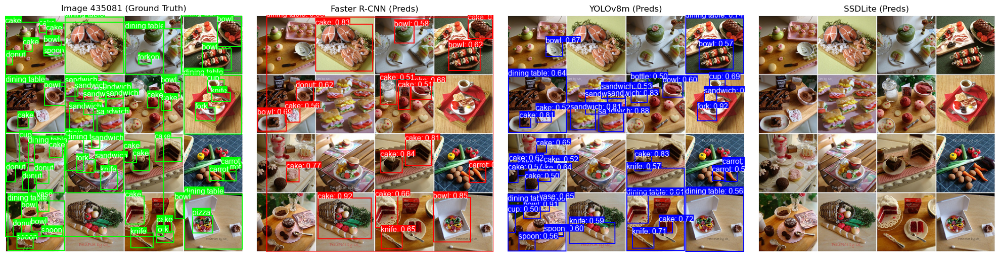


--- Detailed Per-Detection Analysis ---

Faster R-CNN (Red Boxes):
  Pred 1: cake (Score: 0.92) -> Best GT IoU: 0.06 (GT Class: cake) - Status: False Positive
  Pred 2: bowl (Score: 0.85) -> Best GT IoU: 0.01 (GT Class: bowl) - Status: False Positive
  Pred 3: cake (Score: 0.84) -> Best GT IoU: 0.62 (GT Class: cake) - Status: Correct (but poor localization)
  Pred 4: cake (Score: 0.83) -> Best GT IoU: 0.08 (GT Class: cake) - Status: False Positive
  Pred 5: cake (Score: 0.81) -> Best GT IoU: 0.79 (GT Class: cake) - Status: Correct
  Pred 6: cake (Score: 0.77) -> Best GT IoU: 0.01 (GT Class: cake) - Status: False Positive
  Pred 7: bowl (Score: 0.69) -> Best GT IoU: 0.00 (GT Class: bowl) - Status: False Positive
  Pred 8: cake (Score: 0.68) -> Best GT IoU: 0.01 (GT Class: cake) - Status: False Positive
  Pred 9: cake (Score: 0.67) -> Best GT IoU: 0.00 (GT Class: cake) - Status: False Positive
  Pred 10: cake (Score: 0.66) -> Best GT IoU: 0.76 (GT Class: cake) - Status: Correct
  Pred 1

In [201]:
selected_image_id = 435081
analyze_and_visualize_case(
    image_id=selected_image_id, # e.g., success_candidates_yolo_sorted[0]['image_id']
    coco_val_image_dir=coco_val_image_dir,
    rcnn_preds=rcnn_pred_chosen,
    yolo_preds=yolo_pred_chosen,
    ssdlite_preds=ssd_pred_chosen,
    coco_gt_obj=coco_gt_eval,
    yolo_label_mapper=yolo_label_to_coco_id_mapper,
    ssdlite_label_mapper=None # Or your SSDLite specific mapper
)


--- Analyzing Image ID: 216277 ---


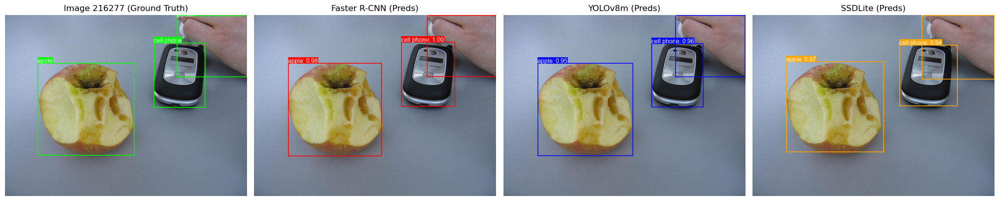


--- Detailed Per-Detection Analysis ---

Faster R-CNN (Red Boxes):
  Pred 1: cell phone (Score: 1.00) -> Best GT IoU: 0.94 (GT Class: cell phone) - Status: Correct
  Pred 2: person (Score: 0.99) -> Best GT IoU: 0.97 (GT Class: person) - Status: Correct
  Pred 3: apple (Score: 0.98) -> Best GT IoU: 0.96 (GT Class: apple) - Status: Correct

YOLOv8m (Blue Boxes):
  Pred 1: cell phone (Score: 0.96) -> Best GT IoU: 0.96 (GT Class: cell phone) - Status: Correct
  Pred 2: apple (Score: 0.95) -> Best GT IoU: 0.98 (GT Class: apple) - Status: Correct
  Pred 3: person (Score: 0.92) -> Best GT IoU: 0.98 (GT Class: person) - Status: Correct

SSDLite (Orange Boxes):
  Pred 1: apple (Score: 0.97) -> Best GT IoU: 0.92 (GT Class: apple) - Status: Correct
  Pred 2: cell phone (Score: 0.94) -> Best GT IoU: 0.84 (GT Class: cell phone) - Status: Correct
  Pred 3: person (Score: 0.75) -> Best GT IoU: 0.91 (GT Class: person) - Status: Correct


In [183]:
selected_image_id = 216277
analyze_and_visualize_case(
    image_id=selected_image_id, # e.g., success_candidates_yolo_sorted[0]['image_id']
    coco_val_image_dir=coco_val_image_dir,
    rcnn_preds=rcnn_pred_chosen,
    yolo_preds=yolo_pred_chosen,
    ssdlite_preds=ssd_pred_chosen,
    coco_gt_obj=coco_gt_eval,
    yolo_label_mapper=yolo_label_to_coco_id_mapper,
    ssdlite_label_mapper=None # Or your SSDLite specific mapper
)


--- Analyzing Image ID: 451150 ---


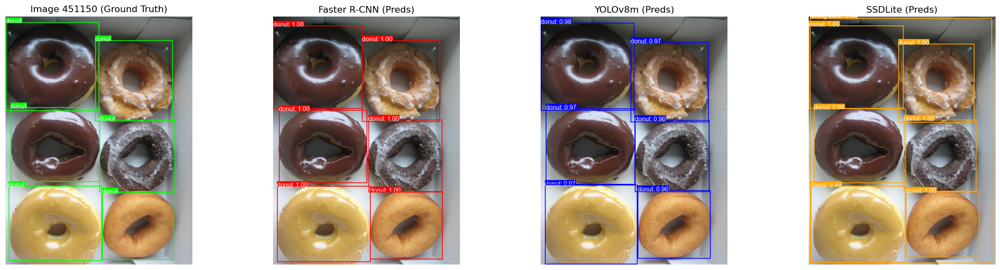


--- Detailed Per-Detection Analysis ---

Faster R-CNN (Red Boxes):
  Pred 1: donut (Score: 1.00) -> Best GT IoU: 0.89 (GT Class: donut) - Status: Correct
  Pred 2: donut (Score: 1.00) -> Best GT IoU: 0.98 (GT Class: donut) - Status: Correct
  Pred 3: donut (Score: 1.00) -> Best GT IoU: 0.94 (GT Class: donut) - Status: Correct
  Pred 4: donut (Score: 1.00) -> Best GT IoU: 0.96 (GT Class: donut) - Status: Correct
  Pred 5: donut (Score: 1.00) -> Best GT IoU: 0.97 (GT Class: donut) - Status: Correct
  Pred 6: donut (Score: 1.00) -> Best GT IoU: 0.96 (GT Class: donut) - Status: Correct

YOLOv8m (Blue Boxes):
  Pred 1: donut (Score: 0.98) -> Best GT IoU: 0.98 (GT Class: donut) - Status: Correct
  Pred 2: donut (Score: 0.97) -> Best GT IoU: 0.93 (GT Class: donut) - Status: Correct
  Pred 3: donut (Score: 0.97) -> Best GT IoU: 0.95 (GT Class: donut) - Status: Correct
  Pred 4: donut (Score: 0.97) -> Best GT IoU: 0.96 (GT Class: donut) - Status: Correct
  Pred 5: donut (Score: 0.96) -> Best G

In [184]:
selected_image_id = 451150
analyze_and_visualize_case(
    image_id=selected_image_id, # e.g., success_candidates_yolo_sorted[0]['image_id']
    coco_val_image_dir=coco_val_image_dir,
    rcnn_preds=rcnn_pred_chosen,
    yolo_preds=yolo_pred_chosen,
    ssdlite_preds=ssd_pred_chosen,
    coco_gt_obj=coco_gt_eval,
    yolo_label_mapper=yolo_label_to_coco_id_mapper,
    ssdlite_label_mapper=None # Or your SSDLite specific mapper
)

## Faster RCNN Failure


--- Analyzing Image ID: 546556 ---


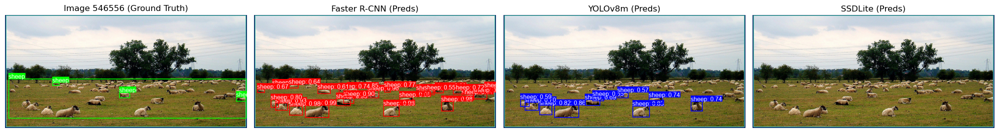


--- Detailed Per-Detection Analysis ---

Faster R-CNN (Red Boxes):
  Pred 1: sheep (Score: 0.99) -> Best GT IoU: 0.03 (GT Class: sheep) - Status: False Positive
  Pred 2: sheep (Score: 0.98) -> Best GT IoU: 0.01 (GT Class: sheep) - Status: False Positive
  Pred 3: sheep (Score: 0.98) -> Best GT IoU: 0.01 (GT Class: sheep) - Status: False Positive
  Pred 4: sheep (Score: 0.98) -> Best GT IoU: 0.02 (GT Class: sheep) - Status: False Positive
  Pred 5: sheep (Score: 0.96) -> Best GT IoU: 0.70 (GT Class: sheep) - Status: Correct (but poor localization)
  Pred 6: sheep (Score: 0.95) -> Best GT IoU: 0.01 (GT Class: sheep) - Status: False Positive
  Pred 7: sheep (Score: 0.95) -> Best GT IoU: 0.01 (GT Class: sheep) - Status: False Positive
  Pred 8: sheep (Score: 0.93) -> Best GT IoU: 0.01 (GT Class: sheep) - Status: False Positive
  Pred 9: sheep (Score: 0.91) -> Best GT IoU: 0.01 (GT Class: sheep) - Status: False Positive
  Pred 10: sheep (Score: 0.90) -> Best GT IoU: 0.01 (GT Class: sheep)

In [185]:
selected_image_id = 546556
analyze_and_visualize_case(
    image_id=selected_image_id, # e.g., success_candidates_yolo_sorted[0]['image_id']
    coco_val_image_dir=coco_val_image_dir,
    rcnn_preds=rcnn_pred_chosen,
    yolo_preds=yolo_pred_chosen,
    ssdlite_preds=ssd_pred_chosen,
    coco_gt_obj=coco_gt_eval,
    yolo_label_mapper=yolo_label_to_coco_id_mapper,
    ssdlite_label_mapper=None # Or your SSDLite specific mapper
)


--- Analyzing Image ID: 491497 ---


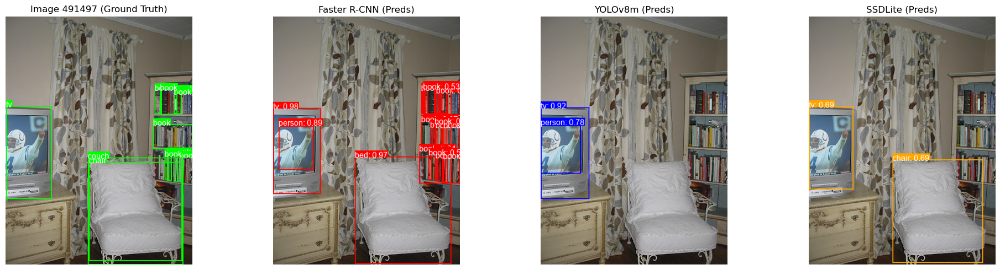


--- Detailed Per-Detection Analysis ---

Faster R-CNN (Red Boxes):
  Pred 1: tv (Score: 0.98) -> Best GT IoU: 0.90 (GT Class: tv) - Status: Correct
  Pred 2: bed (Score: 0.97) -> Best GT IoU: 0.00 (GT Class: N/A) - Status: Mislocalized & Misclassified (bed vs GT N/A)
  Pred 3: person (Score: 0.89) -> Best GT IoU: 0.00 (GT Class: N/A) - Status: Mislocalized & Misclassified (person vs GT N/A)
  Pred 4: book (Score: 0.75) -> Best GT IoU: 0.47 (GT Class: book) - Status: False Positive
  Pred 5: book (Score: 0.70) -> Best GT IoU: 0.26 (GT Class: book) - Status: False Positive
  Pred 6: book (Score: 0.70) -> Best GT IoU: 0.80 (GT Class: book) - Status: Correct
  Pred 7: book (Score: 0.68) -> Best GT IoU: 0.39 (GT Class: book) - Status: False Positive
  Pred 8: book (Score: 0.67) -> Best GT IoU: 0.37 (GT Class: book) - Status: False Positive
  Pred 9: book (Score: 0.67) -> Best GT IoU: 0.84 (GT Class: book) - Status: Correct
  Pred 10: book (Score: 0.66) -> Best GT IoU: 0.42 (GT Class: book)

In [186]:
selected_image_id = 491497
analyze_and_visualize_case(
    image_id=selected_image_id, # e.g., success_candidates_yolo_sorted[0]['image_id']
    coco_val_image_dir=coco_val_image_dir,
    rcnn_preds=rcnn_pred_chosen,
    yolo_preds=yolo_pred_chosen,
    ssdlite_preds=ssd_pred_chosen,
    coco_gt_obj=coco_gt_eval,
    yolo_label_mapper=yolo_label_to_coco_id_mapper,
    ssdlite_label_mapper=None # Or your SSDLite specific mapper
)


--- Analyzing Image ID: 303713 ---


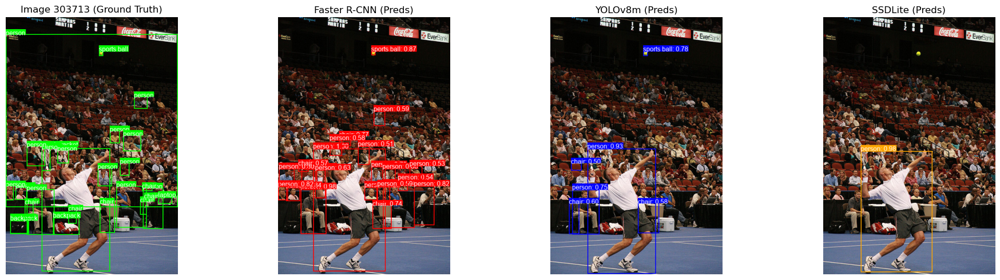


--- Detailed Per-Detection Analysis ---

Faster R-CNN (Red Boxes):
  Pred 1: person (Score: 1.00) -> Best GT IoU: 0.95 (GT Class: person) - Status: Correct
  Pred 2: person (Score: 0.98) -> Best GT IoU: 0.92 (GT Class: person) - Status: Correct
  Pred 3: person (Score: 0.98) -> Best GT IoU: 0.70 (GT Class: person) - Status: Correct (but poor localization)
  Pred 4: person (Score: 0.88) -> Best GT IoU: 0.02 (GT Class: person) - Status: False Positive
  Pred 5: sports ball (Score: 0.87) -> Best GT IoU: 0.70 (GT Class: sports ball) - Status: Correct (but poor localization)
  Pred 6: person (Score: 0.85) -> Best GT IoU: 0.01 (GT Class: person) - Status: False Positive
  Pred 7: person (Score: 0.84) -> Best GT IoU: 0.76 (GT Class: person) - Status: Correct
  Pred 8: person (Score: 0.82) -> Best GT IoU: 0.76 (GT Class: person) - Status: Correct
  Pred 9: person (Score: 0.82) -> Best GT IoU: 0.78 (GT Class: person) - Status: Correct
  Pred 10: person (Score: 0.80) -> Best GT IoU: 0.01 (GT Cl

In [187]:
selected_image_id = 303713
analyze_and_visualize_case(
    image_id=selected_image_id, # e.g., success_candidates_yolo_sorted[0]['image_id']
    coco_val_image_dir=coco_val_image_dir,
    rcnn_preds=rcnn_pred_chosen,
    yolo_preds=yolo_pred_chosen,
    ssdlite_preds=ssd_pred_chosen,
    coco_gt_obj=coco_gt_eval,
    yolo_label_mapper=yolo_label_to_coco_id_mapper,
    ssdlite_label_mapper=None # Or your SSDLite specific mapper
)

## YOLOv8 Success


--- Analyzing Image ID: 365886 ---


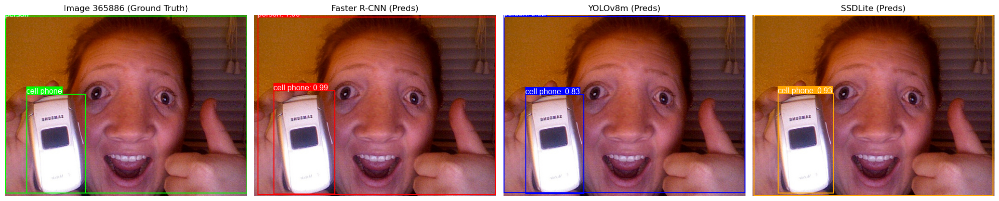


--- Detailed Per-Detection Analysis ---

Faster R-CNN (Red Boxes):
  Pred 1: person (Score: 1.00) -> Best GT IoU: 0.97 (GT Class: person) - Status: Correct
  Pred 2: cell phone (Score: 0.99) -> Best GT IoU: 0.93 (GT Class: cell phone) - Status: Correct

YOLOv8m (Blue Boxes):
  Pred 1: person (Score: 0.92) -> Best GT IoU: 0.99 (GT Class: person) - Status: Correct
  Pred 2: cell phone (Score: 0.83) -> Best GT IoU: 0.99 (GT Class: cell phone) - Status: Correct

SSDLite (Orange Boxes):
  Pred 1: person (Score: 0.99) -> Best GT IoU: 0.97 (GT Class: person) - Status: Correct
  Pred 2: cell phone (Score: 0.93) -> Best GT IoU: 0.93 (GT Class: cell phone) - Status: Correct


In [188]:
selected_image_id = 365886
analyze_and_visualize_case(
    image_id=selected_image_id, # e.g., success_candidates_yolo_sorted[0]['image_id']
    coco_val_image_dir=coco_val_image_dir,
    rcnn_preds=rcnn_pred_chosen,
    yolo_preds=yolo_pred_chosen,
    ssdlite_preds=ssd_pred_chosen,
    coco_gt_obj=coco_gt_eval,
    yolo_label_mapper=yolo_label_to_coco_id_mapper,
    ssdlite_label_mapper=None # Or your SSDLite specific mapper
)


--- Analyzing Image ID: 70048 ---


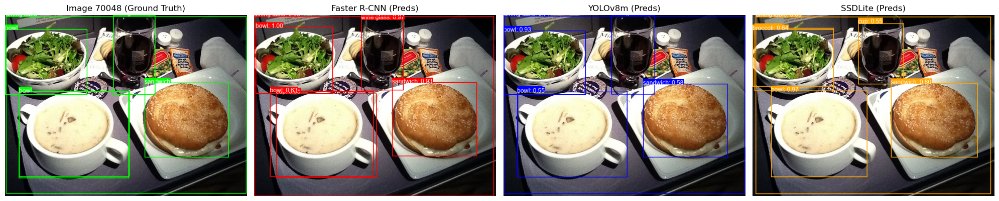


--- Detailed Per-Detection Analysis ---

Faster R-CNN (Red Boxes):
  Pred 1: bowl (Score: 1.00) -> Best GT IoU: 0.90 (GT Class: bowl) - Status: Correct
  Pred 2: wine glass (Score: 0.97) -> Best GT IoU: 0.85 (GT Class: wine glass) - Status: Correct
  Pred 3: cup (Score: 0.95) -> Best GT IoU: 0.89 (GT Class: cup) - Status: Correct
  Pred 4: dining table (Score: 0.95) -> Best GT IoU: 0.98 (GT Class: dining table) - Status: Correct
  Pred 5: sandwich (Score: 0.93) -> Best GT IoU: 0.95 (GT Class: sandwich) - Status: Correct
  Pred 6: bowl (Score: 0.63) -> Best GT IoU: 0.94 (GT Class: bowl) - Status: Correct

YOLOv8m (Blue Boxes):
  Pred 1: bowl (Score: 0.93) -> Best GT IoU: 0.98 (GT Class: bowl) - Status: Correct
  Pred 2: wine glass (Score: 0.89) -> Best GT IoU: 0.96 (GT Class: wine glass) - Status: Correct
  Pred 3: cup (Score: 0.81) -> Best GT IoU: 0.99 (GT Class: cup) - Status: Correct
  Pred 4: dining table (Score: 0.74) -> Best GT IoU: 0.99 (GT Class: dining table) - Status: Correct

In [189]:
selected_image_id = 70048
analyze_and_visualize_case(
    image_id=selected_image_id, # e.g., success_candidates_yolo_sorted[0]['image_id']
    coco_val_image_dir=coco_val_image_dir,
    rcnn_preds=rcnn_pred_chosen,
    yolo_preds=yolo_pred_chosen,
    ssdlite_preds=ssd_pred_chosen,
    coco_gt_obj=coco_gt_eval,
    yolo_label_mapper=yolo_label_to_coco_id_mapper,
    ssdlite_label_mapper=None # Or your SSDLite specific mapper
)


--- Analyzing Image ID: 22935 ---


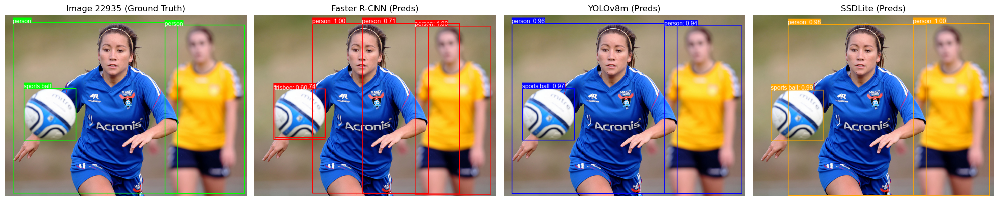


--- Detailed Per-Detection Analysis ---

Faster R-CNN (Red Boxes):
  Pred 1: person (Score: 1.00) -> Best GT IoU: 0.95 (GT Class: person) - Status: Correct
  Pred 2: person (Score: 1.00) -> Best GT IoU: 0.68 (GT Class: person) - Status: Correct (but poor localization)
  Pred 3: sports ball (Score: 0.74) -> Best GT IoU: 0.95 (GT Class: sports ball) - Status: Correct
  Pred 4: person (Score: 0.71) -> Best GT IoU: 0.35 (GT Class: person) - Status: False Positive
  Pred 5: frisbee (Score: 0.60) -> Best GT IoU: 0.00 (GT Class: N/A) - Status: Mislocalized & Misclassified (frisbee vs GT N/A)

YOLOv8m (Blue Boxes):
  Pred 1: sports ball (Score: 0.97) -> Best GT IoU: 0.98 (GT Class: sports ball) - Status: Correct
  Pred 2: person (Score: 0.96) -> Best GT IoU: 0.98 (GT Class: person) - Status: Correct
  Pred 3: person (Score: 0.94) -> Best GT IoU: 0.97 (GT Class: person) - Status: Correct

SSDLite (Orange Boxes):
  Pred 1: person (Score: 1.00) -> Best GT IoU: 0.94 (GT Class: person) - Status: C

In [190]:
selected_image_id = 22935
analyze_and_visualize_case(
    image_id=selected_image_id, # e.g., success_candidates_yolo_sorted[0]['image_id']
    coco_val_image_dir=coco_val_image_dir,
    rcnn_preds=rcnn_pred_chosen,
    yolo_preds=yolo_pred_chosen,
    ssdlite_preds=ssd_pred_chosen,
    coco_gt_obj=coco_gt_eval,
    yolo_label_mapper=yolo_label_to_coco_id_mapper,
    ssdlite_label_mapper=None # Or your SSDLite specific mapper
)

## YOLOV8 Failure 


--- Analyzing Image ID: 157390 ---


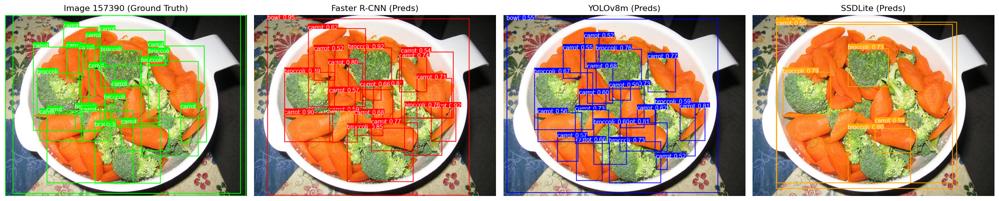


--- Detailed Per-Detection Analysis ---

Faster R-CNN (Red Boxes):
  Pred 1: bowl (Score: 0.95) -> Best GT IoU: 0.86 (GT Class: bowl) - Status: Correct
  Pred 2: broccoli (Score: 0.92) -> Best GT IoU: 0.81 (GT Class: broccoli) - Status: Correct
  Pred 3: carrot (Score: 0.92) -> Best GT IoU: 0.89 (GT Class: carrot) - Status: Correct
  Pred 4: carrot (Score: 0.90) -> Best GT IoU: 0.86 (GT Class: carrot) - Status: Correct
  Pred 5: broccoli (Score: 0.89) -> Best GT IoU: 0.86 (GT Class: broccoli) - Status: Correct
  Pred 6: broccoli (Score: 0.85) -> Best GT IoU: 0.83 (GT Class: broccoli) - Status: Correct
  Pred 7: carrot (Score: 0.81) -> Best GT IoU: 0.38 (GT Class: carrot) - Status: False Positive
  Pred 8: carrot (Score: 0.80) -> Best GT IoU: 0.60 (GT Class: carrot) - Status: Correct (but poor localization)
  Pred 9: carrot (Score: 0.77) -> Best GT IoU: 0.96 (GT Class: carrot) - Status: Correct
  Pred 10: broccoli (Score: 0.76) -> Best GT IoU: 0.34 (GT Class: broccoli) - Status: False 

In [191]:
selected_image_id = 157390
analyze_and_visualize_case(
    image_id=selected_image_id, # e.g., success_candidates_yolo_sorted[0]['image_id']
    coco_val_image_dir=coco_val_image_dir,
    rcnn_preds=rcnn_pred_chosen,
    yolo_preds=yolo_pred_chosen,
    ssdlite_preds=ssd_pred_chosen,
    coco_gt_obj=coco_gt_eval,
    yolo_label_mapper=yolo_label_to_coco_id_mapper,
    ssdlite_label_mapper=None # Or your SSDLite specific mapper
)


--- Analyzing Image ID: 406570 ---


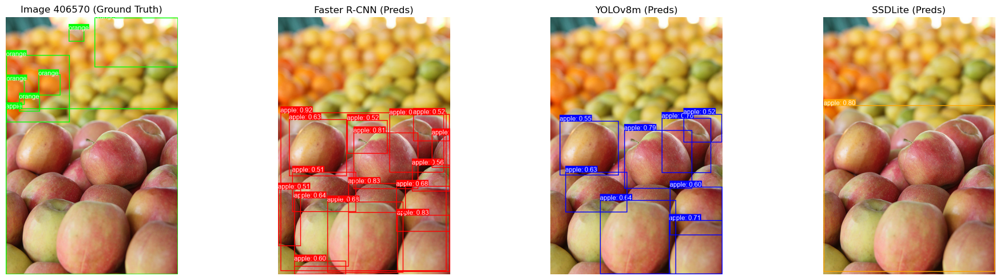


--- Detailed Per-Detection Analysis ---

Faster R-CNN (Red Boxes):
  Pred 1: apple (Score: 0.92) -> Best GT IoU: 0.92 (GT Class: apple) - Status: Correct
  Pred 2: apple (Score: 0.83) -> Best GT IoU: 0.10 (GT Class: apple) - Status: False Positive
  Pred 3: apple (Score: 0.83) -> Best GT IoU: 0.06 (GT Class: apple) - Status: False Positive
  Pred 4: apple (Score: 0.81) -> Best GT IoU: 0.13 (GT Class: apple) - Status: False Positive
  Pred 5: apple (Score: 0.78) -> Best GT IoU: 0.11 (GT Class: apple) - Status: False Positive
  Pred 6: apple (Score: 0.68) -> Best GT IoU: 0.19 (GT Class: apple) - Status: False Positive
  Pred 7: apple (Score: 0.68) -> Best GT IoU: 0.09 (GT Class: apple) - Status: False Positive
  Pred 8: apple (Score: 0.64) -> Best GT IoU: 0.13 (GT Class: apple) - Status: False Positive
  Pred 9: apple (Score: 0.63) -> Best GT IoU: 0.11 (GT Class: apple) - Status: False Positive
  Pred 10: apple (Score: 0.60) -> Best GT IoU: 0.02 (GT Class: apple) - Status: False Positiv

In [192]:
selected_image_id = 406570
analyze_and_visualize_case(
    image_id=selected_image_id, # e.g., success_candidates_yolo_sorted[0]['image_id']
    coco_val_image_dir=coco_val_image_dir,
    rcnn_preds=rcnn_pred_chosen,
    yolo_preds=yolo_pred_chosen,
    ssdlite_preds=ssd_pred_chosen,
    coco_gt_obj=coco_gt_eval,
    yolo_label_mapper=yolo_label_to_coco_id_mapper,
    ssdlite_label_mapper=None # Or your SSDLite specific mapper
)


--- Analyzing Image ID: 289415 ---


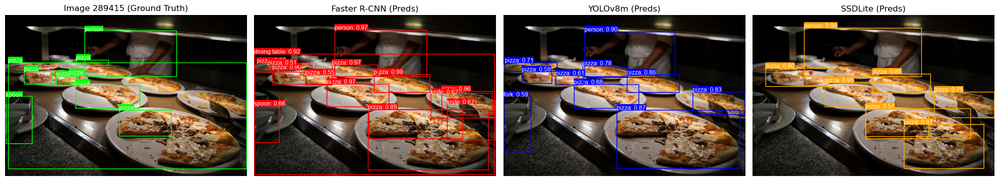


--- Detailed Per-Detection Analysis ---

Faster R-CNN (Red Boxes):
  Pred 1: pizza (Score: 0.99) -> Best GT IoU: 0.05 (GT Class: pizza) - Status: False Positive
  Pred 2: person (Score: 0.97) -> Best GT IoU: 0.96 (GT Class: person) - Status: Correct
  Pred 3: pizza (Score: 0.97) -> Best GT IoU: 0.87 (GT Class: pizza) - Status: Correct
  Pred 4: pizza (Score: 0.97) -> Best GT IoU: 0.02 (GT Class: pizza) - Status: False Positive
  Pred 5: pizza (Score: 0.96) -> Best GT IoU: 0.05 (GT Class: pizza) - Status: False Positive
  Pred 6: dining table (Score: 0.92) -> Best GT IoU: 0.00 (GT Class: N/A) - Status: Mislocalized & Misclassified (dining table vs GT N/A)
  Pred 7: pizza (Score: 0.91) -> Best GT IoU: 0.49 (GT Class: pizza) - Status: False Positive
  Pred 8: pizza (Score: 0.90) -> Best GT IoU: 0.41 (GT Class: pizza) - Status: False Positive
  Pred 9: pizza (Score: 0.89) -> Best GT IoU: 0.03 (GT Class: pizza) - Status: False Positive
  Pred 10: pizza (Score: 0.89) -> Best GT IoU: 0.28 (G

In [194]:
selected_image_id = 289415
analyze_and_visualize_case(
    image_id=selected_image_id, # e.g., success_candidates_yolo_sorted[0]['image_id']
    coco_val_image_dir=coco_val_image_dir,
    rcnn_preds=rcnn_pred_chosen,
    yolo_preds=yolo_pred_chosen,
    ssdlite_preds=ssd_pred_chosen,
    coco_gt_obj=coco_gt_eval,
    yolo_label_mapper=yolo_label_to_coco_id_mapper,
    ssdlite_label_mapper=None # Or your SSDLite specific mapper
)

## SSDLite Success


--- Analyzing Image ID: 4395 ---


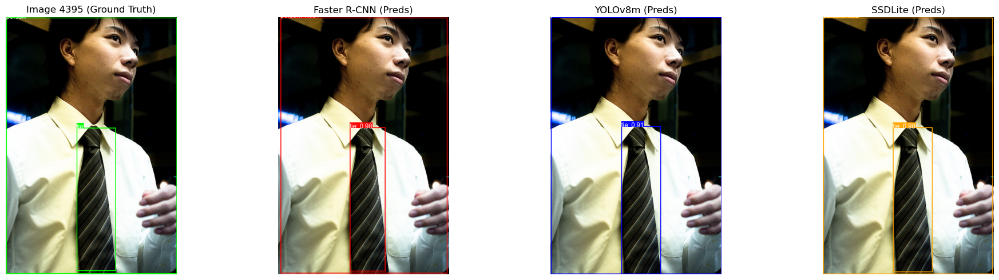


--- Detailed Per-Detection Analysis ---

Faster R-CNN (Red Boxes):
  Pred 1: person (Score: 1.00) -> Best GT IoU: 0.98 (GT Class: person) - Status: Correct
  Pred 2: tie (Score: 0.98) -> Best GT IoU: 0.91 (GT Class: tie) - Status: Correct

YOLOv8m (Blue Boxes):
  Pred 1: tie (Score: 0.91) -> Best GT IoU: 0.95 (GT Class: tie) - Status: Correct
  Pred 2: person (Score: 0.89) -> Best GT IoU: 1.00 (GT Class: person) - Status: Correct

SSDLite (Orange Boxes):
  Pred 1: person (Score: 1.00) -> Best GT IoU: 0.99 (GT Class: person) - Status: Correct
  Pred 2: tie (Score: 0.98) -> Best GT IoU: 0.96 (GT Class: tie) - Status: Correct


In [195]:
selected_image_id = 4395
analyze_and_visualize_case(
    image_id=selected_image_id, # e.g., success_candidates_yolo_sorted[0]['image_id']
    coco_val_image_dir=coco_val_image_dir,
    rcnn_preds=rcnn_pred_chosen,
    yolo_preds=yolo_pred_chosen,
    ssdlite_preds=ssd_pred_chosen,
    coco_gt_obj=coco_gt_eval,
    yolo_label_mapper=yolo_label_to_coco_id_mapper,
    ssdlite_label_mapper=None # Or your SSDLite specific mapper
)


--- Analyzing Image ID: 255824 ---


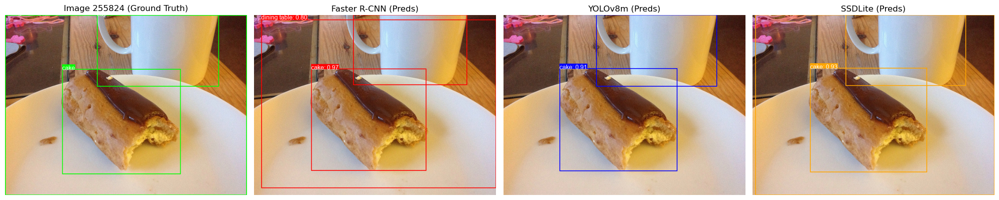


--- Detailed Per-Detection Analysis ---

Faster R-CNN (Red Boxes):
  Pred 1: cup (Score: 0.98) -> Best GT IoU: 0.92 (GT Class: cup) - Status: Correct
  Pred 2: cake (Score: 0.97) -> Best GT IoU: 0.94 (GT Class: cake) - Status: Correct
  Pred 3: dining table (Score: 0.80) -> Best GT IoU: 0.90 (GT Class: dining table) - Status: Correct

YOLOv8m (Blue Boxes):
  Pred 1: cup (Score: 0.98) -> Best GT IoU: 0.99 (GT Class: cup) - Status: Correct
  Pred 2: cake (Score: 0.91) -> Best GT IoU: 0.94 (GT Class: cake) - Status: Correct
  Missed Ground Truths (False Negatives):
    - GT 1: dining table

SSDLite (Orange Boxes):
  Pred 1: cup (Score: 0.96) -> Best GT IoU: 0.97 (GT Class: cup) - Status: Correct
  Pred 2: cake (Score: 0.93) -> Best GT IoU: 0.96 (GT Class: cake) - Status: Correct
  Pred 3: dining table (Score: 0.89) -> Best GT IoU: 0.99 (GT Class: dining table) - Status: Correct


In [196]:
selected_image_id = 255824
analyze_and_visualize_case(
    image_id=selected_image_id, # e.g., success_candidates_yolo_sorted[0]['image_id']
    coco_val_image_dir=coco_val_image_dir,
    rcnn_preds=rcnn_pred_chosen,
    yolo_preds=yolo_pred_chosen,
    ssdlite_preds=ssd_pred_chosen,
    coco_gt_obj=coco_gt_eval,
    yolo_label_mapper=yolo_label_to_coco_id_mapper,
    ssdlite_label_mapper=None # Or your SSDLite specific mapper
)


--- Analyzing Image ID: 475779 ---


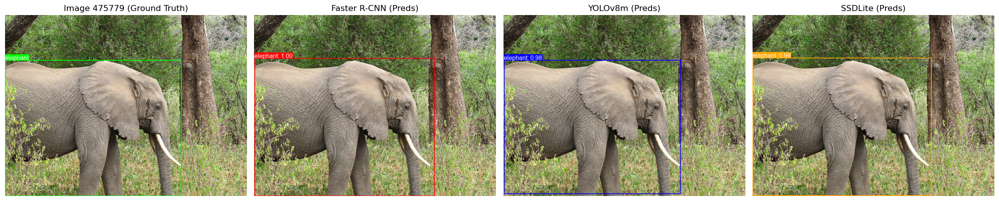


--- Detailed Per-Detection Analysis ---

Faster R-CNN (Red Boxes):
  Pred 1: elephant (Score: 1.00) -> Best GT IoU: 0.96 (GT Class: elephant) - Status: Correct

YOLOv8m (Blue Boxes):
  Pred 1: elephant (Score: 0.98) -> Best GT IoU: 0.98 (GT Class: elephant) - Status: Correct

SSDLite (Orange Boxes):
  Pred 1: elephant (Score: 0.99) -> Best GT IoU: 0.97 (GT Class: elephant) - Status: Correct


In [197]:
selected_image_id = 475779
analyze_and_visualize_case(
    image_id=selected_image_id, # e.g., success_candidates_yolo_sorted[0]['image_id']
    coco_val_image_dir=coco_val_image_dir,
    rcnn_preds=rcnn_pred_chosen,
    yolo_preds=yolo_pred_chosen,
    ssdlite_preds=ssd_pred_chosen,
    coco_gt_obj=coco_gt_eval,
    yolo_label_mapper=yolo_label_to_coco_id_mapper,
    ssdlite_label_mapper=None # Or your SSDLite specific mapper
)

## SSDLite Failure


--- Analyzing Image ID: 538236 ---


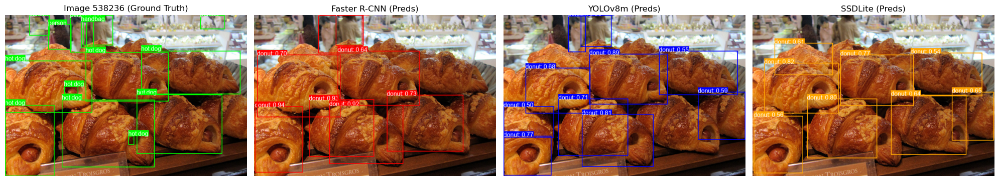


--- Detailed Per-Detection Analysis ---

Faster R-CNN (Red Boxes):
  Pred 1: donut (Score: 0.94) -> Best GT IoU: 0.00 (GT Class: N/A) - Status: Mislocalized & Misclassified (donut vs GT N/A)
  Pred 2: donut (Score: 0.93) -> Best GT IoU: 0.00 (GT Class: N/A) - Status: Mislocalized & Misclassified (donut vs GT N/A)
  Pred 3: person (Score: 0.93) -> Best GT IoU: 0.54 (GT Class: person) - Status: Correct (but poor localization)
  Pred 4: donut (Score: 0.92) -> Best GT IoU: 0.00 (GT Class: N/A) - Status: Mislocalized & Misclassified (donut vs GT N/A)
  Pred 5: donut (Score: 0.73) -> Best GT IoU: 0.00 (GT Class: N/A) - Status: Mislocalized & Misclassified (donut vs GT N/A)
  Pred 6: donut (Score: 0.70) -> Best GT IoU: 0.00 (GT Class: N/A) - Status: Mislocalized & Misclassified (donut vs GT N/A)
  Pred 7: donut (Score: 0.64) -> Best GT IoU: 0.00 (GT Class: N/A) - Status: Mislocalized & Misclassified (donut vs GT N/A)
  Pred 8: person (Score: 0.60) -> Best GT IoU: 0.81 (GT Class: person) - St

In [198]:
selected_image_id = 538236
analyze_and_visualize_case(
    image_id=selected_image_id, # e.g., success_candidates_yolo_sorted[0]['image_id']
    coco_val_image_dir=coco_val_image_dir,
    rcnn_preds=rcnn_pred_chosen,
    yolo_preds=yolo_pred_chosen,
    ssdlite_preds=ssd_pred_chosen,
    coco_gt_obj=coco_gt_eval,
    yolo_label_mapper=yolo_label_to_coco_id_mapper,
    ssdlite_label_mapper=None # Or your SSDLite specific mapper
)


--- Analyzing Image ID: 489842 ---


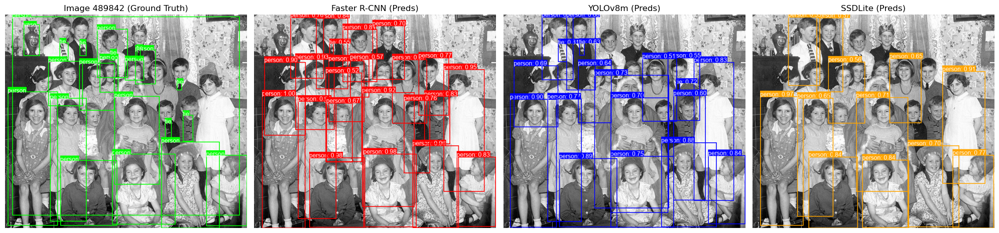


--- Detailed Per-Detection Analysis ---

Faster R-CNN (Red Boxes):
  Pred 1: person (Score: 1.00) -> Best GT IoU: 0.83 (GT Class: person) - Status: Correct
  Pred 2: person (Score: 0.98) -> Best GT IoU: 0.82 (GT Class: person) - Status: Correct
  Pred 3: person (Score: 0.98) -> Best GT IoU: 0.91 (GT Class: person) - Status: Correct
  Pred 4: person (Score: 0.96) -> Best GT IoU: 0.75 (GT Class: person) - Status: Correct
  Pred 5: person (Score: 0.96) -> Best GT IoU: 0.91 (GT Class: person) - Status: Correct
  Pred 6: person (Score: 0.95) -> Best GT IoU: 0.16 (GT Class: person) - Status: False Positive
  Pred 7: person (Score: 0.93) -> Best GT IoU: 0.56 (GT Class: person) - Status: Correct (but poor localization)
  Pred 8: person (Score: 0.92) -> Best GT IoU: 0.67 (GT Class: person) - Status: Correct (but poor localization)
  Pred 9: person (Score: 0.90) -> Best GT IoU: 0.23 (GT Class: person) - Status: False Positive
  Pred 10: person (Score: 0.87) -> Best GT IoU: 0.12 (GT Class: perso

In [199]:
selected_image_id = 489842
analyze_and_visualize_case(
    image_id=selected_image_id, # e.g., success_candidates_yolo_sorted[0]['image_id']
    coco_val_image_dir=coco_val_image_dir,
    rcnn_preds=rcnn_pred_chosen,
    yolo_preds=yolo_pred_chosen,
    ssdlite_preds=ssd_pred_chosen,
    coco_gt_obj=coco_gt_eval,
    yolo_label_mapper=yolo_label_to_coco_id_mapper,
    ssdlite_label_mapper=None # Or your SSDLite specific mapper
)


--- Analyzing Image ID: 268375 ---


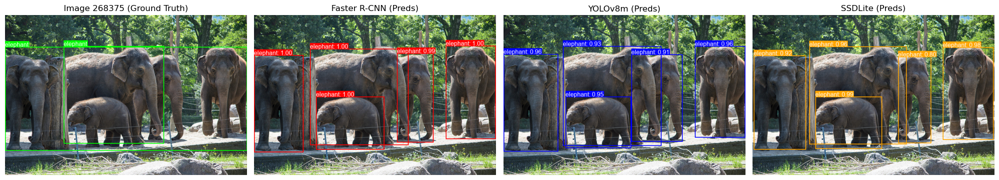


--- Detailed Per-Detection Analysis ---

Faster R-CNN (Red Boxes):
  Pred 1: elephant (Score: 1.00) -> Best GT IoU: 0.31 (GT Class: elephant) - Status: False Positive
  Pred 2: elephant (Score: 1.00) -> Best GT IoU: 0.18 (GT Class: elephant) - Status: False Positive
  Pred 3: elephant (Score: 1.00) -> Best GT IoU: 0.19 (GT Class: elephant) - Status: False Positive
  Pred 4: elephant (Score: 1.00) -> Best GT IoU: 0.89 (GT Class: elephant) - Status: Correct
  Pred 5: elephant (Score: 0.99) -> Best GT IoU: 0.13 (GT Class: elephant) - Status: False Positive
  Missed Ground Truths (False Negatives):
    - GT 2: elephant

YOLOv8m (Blue Boxes):
  Pred 1: elephant (Score: 0.96) -> Best GT IoU: 0.18 (GT Class: elephant) - Status: False Positive
  Pred 2: elephant (Score: 0.96) -> Best GT IoU: 0.21 (GT Class: elephant) - Status: False Positive
  Pred 3: elephant (Score: 0.95) -> Best GT IoU: 0.31 (GT Class: elephant) - Status: False Positive
  Pred 4: elephant (Score: 0.93) -> Best GT IoU: 0.96

In [200]:
selected_image_id = 268375
analyze_and_visualize_case(
    image_id=selected_image_id, # e.g., success_candidates_yolo_sorted[0]['image_id']
    coco_val_image_dir=coco_val_image_dir,
    rcnn_preds=rcnn_pred_chosen,
    yolo_preds=yolo_pred_chosen,
    ssdlite_preds=ssd_pred_chosen,
    coco_gt_obj=coco_gt_eval,
    yolo_label_mapper=yolo_label_to_coco_id_mapper,
    ssdlite_label_mapper=None # Or your SSDLite specific mapper
)

# **Pascal VOC 2007 Dataset**

## Loading Dataset and Setting up Dataloader

In [56]:
# --- Pascal VOC 2007 Test Dataset ---
print("Loading Pascal VOC 2007 Test Dataset...")
# The 'root' for VOC typically points to the VOCdevkit/VOC2007 folder
# Adjust 'voc_root_dir' based on your exact unzipping structure.
# If you unzipped VOCtest_06-Nov-2007.tar into /content/drive/MyDrive/datasets/VOC2007_test,
# then the actual VOCdevkit folder might be at {base_dataset_dir}/VOC2007_test/VOCdevkit/VOC2007
voc_root_dir = f"{base_dataset_dir}/VOC2007_test/" # Adjust this path if your VOCdevkit is directly under VOC2007_test

voc_test_transform = torchvision.transforms.Compose([
    torchvision.transforms.ToTensor()
])

# Initialize the Pascal VOC dataset
# 'year' should be '2007' for VOC 2007
# 'image_set' should be 'test' for the test set
voc_test_dataset = torchvision.datasets.VOCDetection(
    root=voc_root_dir,
    year='2007',
    image_set='test'
)

print(f"Number of images in Pascal VOC 2007 Test Dataset: {len(voc_test_dataset)}")
print("Pascal VOC dataset loaded.\n")

def voc_collate_fn(batch):
    images = [item[0] for item in batch] # Extracts PIL Images
    targets_xml = [item[1] for item in batch] # Extracts the raw XML annotation dictionary
    return images, targets_xml
    
print("\nCreating DataLoader...")
voc_test_dataloader = DataLoader(
    voc_test_dataset,
    batch_size=4, # Setting batch_size=1 makes individual image preprocessing simpler
    shuffle=False, # No need to shuffle for validation/testing
    num_workers=0,
    collate_fn=voc_collate_fn
)
print("DataLoader created successfully.")
print(f"VOC DataLoader batch size: {voc_test_dataloader.batch_size}")

Loading Pascal VOC 2007 Test Dataset...
Number of images in Pascal VOC 2007 Test Dataset: 4952
Pascal VOC dataset loaded.


Creating DataLoader...
DataLoader created successfully.
VOC DataLoader batch size: 4


## Evaluation Helpers

In [155]:
# --- 0. Essential VOC and COCO Mappings (Define these once globally in your script) ---

# Pascal VOC 2007 Classes (ordered alphabetically, often used for 0-19 indexing)
# This order is standard for VOC evaluation and will determine your 0-19 labels.
# Classes will be renamed to match that of COCO (aeroplane -> airplane, diningtable -> dining table
# motorbike -> motorcycle, pottedplant -> potted plant, sofa -> couch, tvmonitor -> tv)
VOC_CLASSES_for_coco = (
    "airplane", "bicycle", "bird", "boat", "bottle", "bus", "car", "cat",
    "chair", "cow", "dining table", "dog", "horse", "motorcycle", "person",
    "potted plant", "sheep", "couch", "train", "tv"
)

# Mapper: VOC 0-19 Index -> VOC Class Name String
VOC_LABEL_TO_NAME = {i: name for i, name in enumerate(VOC_CLASSES)}

# Mapper: VOC Class Name String -> VOC 0-19 Index
VOC_NAME_TO_LABEL = {name: i for i, name in enumerate(VOC_CLASSES)}


# --- Ensure COCO Mappings are available (typically from your COCO setup) ---
# If not already defined, define them based on your coco_gt_eval object:
# coco_id_to_name_map = {cat['id']: cat['name'] for cat in coco_gt_eval.loadCats(coco_gt_eval.getCatIds())}
# coco_name_to_id_map = {cat['name']: cat['id'] for cat in coco_gt_eval.loadCats(coco_gt_eval.getCatIds())}


# --- CRITICAL MAPPER: COCO Category ID -> VOC 0-19 Label Index ---
# This dictionary maps the official COCO category IDs (e.g., 1, 13)
# to the 0-19 integer indices required for VOC evaluation.
COCO_ID_TO_VOC_LABEL = {}
for voc_idx, voc_name in enumerate(VOC_CLASSES_for_coco):
    # Check if this VOC class name exists in COCO
    if voc_name in coco_name_to_id_map:
        coco_id = coco_name_to_id_map[voc_name]
        COCO_ID_TO_VOC_LABEL[coco_id] = voc_idx
    else:
        # This warning should ideally not trigger for standard VOC classes if coco_name_to_id_map is correct
        print(f"Warning: VOC class '{voc_name}' does not have a direct COCO ID mapping. It will be ignored for VOC evaluation.")

# Optional: Print to verify this crucial mapping (highly recommended for debugging)
print("\n--- COCO ID to VOC Label (0-19 Index) Mapping for Filtering/Conversion ---")
for coco_id, voc_label_idx in sorted(COCO_ID_TO_VOC_LABEL.items()):
    coco_name = coco_id_to_name_map.get(coco_id, 'UNKNOWN_COCO_CLASS')
    print(f"  COCO ID {coco_id} ({coco_name}) -> VOC Label Index {voc_label_idx} ({VOC_LABEL_TO_NAME.get(voc_label_idx, 'UNKNOWN_VOC_CLASS')})")
print("-" * 70)




--- COCO ID to VOC Label (0-19 Index) Mapping for Filtering/Conversion ---
  COCO ID 1 (person) -> VOC Label Index 14 (person)
  COCO ID 2 (bicycle) -> VOC Label Index 1 (bicycle)
  COCO ID 3 (car) -> VOC Label Index 6 (car)
  COCO ID 4 (motorcycle) -> VOC Label Index 13 (motorbike)
  COCO ID 5 (airplane) -> VOC Label Index 0 (aeroplane)
  COCO ID 6 (bus) -> VOC Label Index 5 (bus)
  COCO ID 7 (train) -> VOC Label Index 18 (train)
  COCO ID 9 (boat) -> VOC Label Index 3 (boat)
  COCO ID 16 (bird) -> VOC Label Index 2 (bird)
  COCO ID 17 (cat) -> VOC Label Index 7 (cat)
  COCO ID 18 (dog) -> VOC Label Index 11 (dog)
  COCO ID 19 (horse) -> VOC Label Index 12 (horse)
  COCO ID 20 (sheep) -> VOC Label Index 16 (sheep)
  COCO ID 21 (cow) -> VOC Label Index 9 (cow)
  COCO ID 44 (bottle) -> VOC Label Index 4 (bottle)
  COCO ID 62 (chair) -> VOC Label Index 8 (chair)
  COCO ID 63 (couch) -> VOC Label Index 17 (sofa)
  COCO ID 64 (potted plant) -> VOC Label Index 15 (pottedplant)
  COCO ID 67

In [95]:
# --- Step 1 Function: Convert Model Predictions to VOC-Specific Format ---
def convert_predictions_to_voc_format(predictions, model_label_mapper=None):
    """
    Converts model predictions into a format suitable for VOC evaluation.
    Filters to VOC-only classes and maps to VOC's 0-19 labels.

    Args:
        predictions: List of dicts from run_inference_... functions
                     Expected format for each dict:
                     {'image_id': str (VOC image name, e.g., '000001'),
                      'boxes': np.array, 'labels': np.array, 'scores': np.array}
        model_label_mapper (dict, optional): A dictionary to map the model's raw output labels
                                            (e.g., YOLO's 0-79, or torchvision's COCO IDs) to
                                            official COCO category IDs.
                                            - For YOLOv8: `yolo_label_to_coco_id_mapper`
                                            - For Faster R-CNN/SSDLite (torchvision): `torchvision_coco_id_mapper`
                                            - If None, assumes `labels` in `predictions` are already
                                              official COCO category IDs (e.g., direct output from torchvision).

    Returns:
        A list of dictionaries, where each dictionary contains predictions for one image:
        {'image_id': str, 'boxes': np.array, 'labels': np.array, 'scores': np.array}
        Labels are 0-19 integer indices for VOC classes.
    """
    voc_predictions_filtered = []
    for pred_per_image in predictions:
        image_id = pred_per_image['image_id'] # This is the VOC image name string (e.g., '000001')
        boxes = pred_per_image['boxes']
        labels_raw = pred_per_image['labels'] # Model's raw output labels (e.g., YOLO's 0-79, or torchvision's COCO IDs)
        scores = pred_per_image['scores']

        # Step 1.1: Map model's raw labels to COCO IDs
        if model_label_mapper is not None:
            # `labels_raw` must be convertible to int for dict lookup
            labels_coco_ids = np.array([model_label_mapper.get(int(lbl), -1) for lbl in labels_raw])
        else: # Assume model_label_mapper is None implies labels_raw are already COCO IDs
            labels_coco_ids = labels_raw

        filtered_boxes = []
        filtered_labels_voc_idx = []
        filtered_scores = []

        # Step 1.2 & 1.3: Filter to VOC-relevant COCO IDs and re-map to VOC's 0-19 indices
        for i in range(len(labels_coco_ids)):
            coco_id = labels_coco_ids[i]
            # Check if this COCO_ID corresponds to one of the 20 VOC classes
            if coco_id in COCO_ID_TO_VOC_LABEL:
                voc_label_idx = COCO_ID_TO_VOC_LABEL[coco_id] # Get the 0-19 VOC index
                filtered_boxes.append(boxes[i])
                filtered_labels_voc_idx.append(voc_label_idx)
                filtered_scores.append(scores[i])
        
        voc_predictions_filtered.append({
            'image_id': image_id, # Keep original VOC image name string
            'boxes': np.array(filtered_boxes, dtype=np.float32) if filtered_boxes else np.empty((0,4), dtype=np.float32),
            'labels': np.array(filtered_labels_voc_idx, dtype=np.int64) if filtered_labels_voc_idx else np.empty((0,), dtype=np.int64),
            'scores': np.array(filtered_scores, dtype=np.float32) if filtered_scores else np.empty((0,), dtype=np.float32)
        })
    return voc_predictions_filtered

In [156]:
print("\n--- Converting Faster R-CNN VOC Predictions ---")
voc_det_rcnn_low = convert_predictions_to_voc_format(rcnn_voc_predictions_low_score, torchvision_coco_id_mapper)
print(f"Faster R-CNN VOC predictions processed. Total images: {len(voc_det_rcnn_low)}")

print("\n--- Converting YOLOv8 VOC Predictions ---")
voc_det_yolo_low = convert_predictions_to_voc_format(yolo_voc_predictions_low_score, yolo_label_to_coco_id_mapper)
print(f"YOLOv8 VOC predictions processed. Total images: {len(voc_det_yolo_low)}")

print("\n--- Converting SSDLite VOC Predictions ---")
voc_det_ssd_low = convert_predictions_to_voc_format(ssd_voc_predictions_low_score, torchvision_coco_id_mapper)
print(f"SSDLite VOC predictions processed. Total images: {len(voc_det_ssd_low)}")


--- Converting Faster R-CNN VOC Predictions ---
Faster R-CNN VOC predictions processed. Total images: 4952

--- Converting YOLOv8 VOC Predictions ---
YOLOv8 VOC predictions processed. Total images: 4952

--- Converting SSDLite VOC Predictions ---
SSDLite VOC predictions processed. Total images: 4952


In [157]:
VOC_CLASSES = (
    "aeroplane", "bicycle", "bird", "boat", "bottle", "bus", "car", "cat",
    "chair", "cow", "diningtable", "dog", "horse", "motorbike", "person",
    "pottedplant", "sheep", "sofa", "train", "tvmonitor"
)

# Mapper: VOC 0-19 Index -> VOC Class Name String
VOC_LABEL_TO_NAME = {i: name for i, name in enumerate(VOC_CLASSES)}

# Mapper: VOC Class Name String -> VOC 0-19 Index
VOC_NAME_TO_LABEL = {name: i for i, name in enumerate(VOC_CLASSES)}

In [158]:
# --- Helper Function: Parse VOC XML Annotation (MUST be at top-level) ---
def parse_voc_annotation(voc_target_xml_root):
    """
    Parses the XML target from torchvision.datasets.VOCDetection to extract
    ground truth bounding boxes, labels, and 'difficult' flags.

    Args:
        voc_target_xml_root: The root element of the parsed XML tree
                             (e.g., target['annotation'] from VOCDetection).

    Returns:
        A dictionary with:
        'boxes': np.array of [x1, y1, x2, y2]
        'labels': np.array of int (0-indexed class IDs, 0-19 for VOC classes)
        'difficult': np.array of bool (True if object is difficult)
    """
    boxes = []
    labels = []
    difficult_flags = []

    # Iterate through each 'object' tag in the XML
    for obj in voc_target_xml_root.findall('object'):
        name = obj.find('name').text # Get the class name string (e.g., 'car')
        
        # Get bounding box coordinates
        bndbox = obj.find('bndbox')
        xmin = float(bndbox.find('xmin').text)
        ymin = float(bndbox.find('ymin').text)
        xmax = float(bndbox.find('xmax').text)
        ymax = float(bndbox.find('ymax').text)

        # Get 'difficult' flag (default to 0 if not present)
        difficult = int(obj.find('difficult').text) if obj.find('difficult') is not None else 0

        boxes.append([xmin, ymin, xmax, ymax])
        labels.append(VOC_NAME_TO_LABEL[name]) # Convert string name to 0-indexed integer label
        difficult_flags.append(bool(difficult))

    return {
        'boxes': np.array(boxes, dtype=np.float32) if boxes else np.empty((0, 4), dtype=np.float32),
        'labels': np.array(labels, dtype=np.int64) if labels else np.empty((0,), dtype=np.int64),
        'difficult': np.array(difficult_flags, dtype=bool) if difficult_flags else np.empty((0,), dtype=bool)
    }

# --- Step 2 Function: Prepare Ground Truth and Predictions for torchmetrics ---
def prepare_for_torchmetrics_voc_eval(all_predictions_from_inference, voc_dataset, device):
    """
    Prepares model predictions and ground truth annotations for torchmetrics.MeanAveragePrecision
    in Pascal VOC format.

    Args:
        all_predictions_from_inference: List of dictionaries of *processed* predictions (from Step 1):
                                        {'image_id': str (VOC image name),
                                         'boxes': np.array, 'labels': np.array (0-19 VOC idx), 'scores': np.array}
        voc_dataset: An instance of torchvision.datasets.VOCDetection (e.g., the VOC 2007 test set).
        device: The device (cuda or cpu) to place the resulting tensors on.

    Returns:
        Two lists:
        - `preds_torchmetrics`: List of dicts for predictions, formatted for torchmetrics.
                                [{boxes: tensor, scores: tensor, labels: tensor}, ...]
        - `targets_torchmetrics`: List of dicts for ground truths, formatted for torchmetrics.
                                 [{boxes: tensor, labels: tensor}, ...]
        These lists will be in the same order as the images in `voc_dataset`.
    """
    preds_torchmetrics = []
    targets_torchmetrics = []

    # Create a quick lookup map for predictions by image_id (string)
    predictions_map_by_image_id = {p['image_id']: p for p in all_predictions_from_inference}

    # Iterate directly over the VOC dataset to ensure correct order and access to XML targets
    for i in tqdm(range(len(voc_dataset)), desc="Preparing VOC GT & Preds for Torchmetrics"):
        # Get the raw XML target dictionary for the current image
        # voc_dataset[i] returns (PIL_Image, XML_dict_target)
        _, target_xml_dict = voc_dataset[i] # target_xml_dict is a Python dictionary

        # Access the 'filename' key directly from the dictionary structure
        # Example structure: {'annotation': {'filename': '000001.jpg', ...}}
        image_filename_with_ext = target_xml_dict['annotation']['filename']
        plain_image_name = image_filename_with_ext.split('.')[0] # This gets '000001'

        # --- Add Ground Truth to targets_torchmetrics list ---
        # Re-parse the XML from the string content if targets_xml_dict isn't directly the root
        # This is the original way parse_voc_annotation expects its input (an ElementTree root)
        xml_file_path = voc_dataset.annotations[i] # Get the path to the XML file
        xml_root_element = ET.parse(xml_file_path).getroot() # Re-parse it to get the ElementTree root
        
        parsed_gt = parse_voc_annotation(xml_root_element) # Pass the ElementTree root here
        
        targets_torchmetrics.append({
            'boxes': torch.tensor(parsed_gt['boxes'], dtype=torch.float32).to(device),
            'labels': torch.tensor(parsed_gt['labels'], dtype=torch.int64).to(device),
        })

        # --- Add Corresponding Prediction to preds_torchmetrics list (in the same order as GTs) ---
        pred_data = predictions_map_by_image_id.get(plain_image_name, {
            'boxes': np.empty((0, 4), dtype=np.float32),
            'labels': np.empty((0,), dtype=np.int64),
            'scores': np.empty((0,), dtype=np.float32)
        })
        preds_torchmetrics.append({
            'boxes': torch.tensor(pred_data['boxes'], dtype=torch.float32).to(device),
            'scores': torch.tensor(pred_data['scores'], dtype=torch.float32).to(device),
            'labels': torch.tensor(pred_data['labels'], dtype=torch.int64).to(device)
        })
    
    return preds_torchmetrics, targets_torchmetrics

In [110]:
print("\n--- Preparing Faster R-CNN Predictions for Torchmetrics ---")
rcnn_preds_tm, rcnn_targets_tm = prepare_for_torchmetrics_voc_eval(
    voc_det_rcnn_low, voc_test_dataset, device
)
print(f"Faster R-CNN data prepared for torchmetrics. {len(rcnn_preds_tm)} images processed.")


print("\n--- Preparing YOLOv8 Predictions for Torchmetrics ---")
yolo_preds_tm, yolo_targets_tm = prepare_for_torchmetrics_voc_eval(
    voc_det_yolo_low, voc_test_dataset, device
)
print(f"YOLOv8 data prepared for torchmetrics. {len(yolo_preds_tm)} images processed.")


print("\n--- Preparing SSDLite Predictions for Torchmetrics ---")
ssdlite_preds_tm, ssdlite_targets_tm = prepare_for_torchmetrics_voc_eval(
    voc_det_ssd_low, voc_test_dataset, device
)
print(f"SSDLite data prepared for torchmetrics. {len(ssdlite_preds_tm)} images processed.")


# Now these `_preds_tm` and `_targets_tm` lists are ready for Step 3 (evaluate_voc_torchmetrics).


--- Preparing Faster R-CNN Predictions for Torchmetrics ---


Preparing VOC GT & Preds for Torchmetrics: 100%|██████████████████████████████████| 4952/4952 [00:20<00:00, 242.18it/s]


Faster R-CNN data prepared for torchmetrics. 4952 images processed.

--- Preparing YOLOv8 Predictions for Torchmetrics ---


Preparing VOC GT & Preds for Torchmetrics: 100%|██████████████████████████████████| 4952/4952 [00:19<00:00, 255.53it/s]


YOLOv8 data prepared for torchmetrics. 4952 images processed.

--- Preparing SSDLite Predictions for Torchmetrics ---


Preparing VOC GT & Preds for Torchmetrics: 100%|██████████████████████████████████| 4952/4952 [00:20<00:00, 238.39it/s]

SSDLite data prepared for torchmetrics. 4952 images processed.


In [123]:
# --- Step 3 Function: Evaluate Models using torchmetrics ---
def evaluate_voc_torchmetrics(preds_torchmetrics, targets_torchmetrics, device, iou_threshold=0.5):
    """
    Evaluates object detection predictions against Pascal VOC ground truth using torchmetrics.

    Args:
        preds_torchmetrics: List of dictionaries of predictions, formatted for torchmetrics.
                            [{boxes: tensor, scores: tensor, labels: tensor}, ...]
        targets_torchmetrics: List of dictionaries of ground truths, formatted for torchmetrics.
                             [{boxes: tensor, labels: tensor}, ...]
        device: The device (cuda or cpu) on which to perform metric calculation.
        iou_threshold: The single IoU threshold for Pascal VOC evaluation (default 0.5).

    Returns:
        A dictionary containing:
        - 'mAP': Mean Average Precision (overall).
        - 'AP_per_class': Dictionary of AP for each class.
    """
    print(f"\n--- Starting Pascal VOC evaluation with Torchmetrics @ IoU={iou_threshold:.2f} ---")

    # Initialize the MeanAveragePrecision metric
    metric = MeanAveragePrecision(
        box_format='xyxy',
        iou_type='bbox',
        iou_thresholds=[iou_threshold], # Ensure only this specific IoU is used (for Pascal VOC)
        class_metrics=True,           # <--- Keep this to get per-class APs
        average='macro'               # <--- This is the standard for mAP (average over classes)
    ).to(device)

    # Update the metric with predictions and targets
    # Both lists MUST be in the same order and length, which `prepare_for_torchmetrics_voc_eval` ensures.
    metric.update(preds_torchmetrics, targets_torchmetrics)

    # Compute and retrieve the results
    metrics_result = metric.compute()

    # Extract relevant results
    # The output keys from `compute()` might also differ slightly based on version.
    # Based on your documentation, `map` and `map_per_class` should be available.
    
    # For VOC, `map` directly refers to mAP@0.50 if only one iou_threshold is given.
    mAP_at_iou = metrics_result['map'].item() # Access the 'map' key directly

    # Per-class APs are in `map_per_class`
    ap_per_class_tensor = metrics_result['map_per_class']

    AP_per_class_dict = {}
    # Ensure to handle potential -1 values for classes not present
    for i, ap_val in enumerate(ap_per_class_tensor):
        class_name = VOC_LABEL_TO_NAME.get(i, f"Class {i}") # Get class name from 0-19 index
        if ap_val != -1: # Filter out -1 (often means no GT or detections for that class)
            AP_per_class_dict[class_name] = ap_val.item()
        else:
            AP_per_class_dict[class_name] = float('nan') # Indicate not applicable

    print("\n--- Pascal VOC Evaluation Results (Torchmetrics) ---")
    for class_name in VOC_CLASSES: # Print in predefined order
        ap_value = AP_per_class_dict.get(class_name, float('nan'))
        if not np.isnan(ap_value):
            print(f"  AP for {class_name:<15}: {ap_value:.4f}")
        else:
            print(f"  AP for {class_name:<15}: N/A") # Or some other indication
    print(f"--------------------------------------------------")
    print(f"Mean Average Precision (mAP) @ IoU={iou_threshold:.2f}: {mAP_at_iou:.4f}")
    print(f"--------------------------------------------------")

    return {'mAP': mAP_at_iou, 'AP_per_class': AP_per_class_dict}

## VOC Evaluation

In [124]:
# --- Evaluate Faster R-CNN ---
print("\nEvaluating Faster R-CNN on VOC 2007 Test Set...")
rcnn_voc_results = evaluate_voc_torchmetrics(
    preds_torchmetrics=rcnn_preds_tm,
    targets_torchmetrics=rcnn_targets_tm,
    device=device,
    iou_threshold=0.5
)
# You can store or print rcnn_voc_results['mAP'] etc.

# --- Evaluate YOLOv8 ---
print("\nEvaluating YOLOv8 on VOC 2007 Test Set...")
yolo_voc_results = evaluate_voc_torchmetrics(
    preds_torchmetrics=yolo_preds_tm,
    targets_torchmetrics=yolo_targets_tm,
    device=device,
    iou_threshold=0.5
)

# --- Evaluate SSDLite ---
print("\nEvaluating SSDLite on VOC 2007 Test Set...")
ssdlite_voc_results = evaluate_voc_torchmetrics(
    preds_torchmetrics=ssdlite_preds_tm,
    targets_torchmetrics=ssdlite_targets_tm,
    device=device,
    iou_threshold=0.5
)


Evaluating Faster R-CNN on VOC 2007 Test Set...

--- Starting Pascal VOC evaluation with Torchmetrics @ IoU=0.50 ---

--- Pascal VOC Evaluation Results (Torchmetrics) ---
  AP for aeroplane      : 0.8450
  AP for bicycle        : 0.8391
  AP for bird           : 0.7599
  AP for boat           : 0.5825
  AP for bottle         : 0.5914
  AP for bus            : 0.8659
  AP for car            : 0.8157
  AP for cat            : 0.9028
  AP for chair          : 0.5977
  AP for cow            : 0.8765
  AP for diningtable    : 0.6688
  AP for dog            : 0.8641
  AP for horse          : 0.8912
  AP for motorbike      : 0.8844
  AP for person         : 0.8607
  AP for pottedplant    : 0.4977
  AP for sheep          : 0.8447
  AP for sofa           : 0.7543
  AP for train          : 0.8915
  AP for tvmonitor      : 0.7895
--------------------------------------------------
Mean Average Precision (mAP) @ IoU=0.50: 0.7812
--------------------------------------------------

Evaluating YOLOv8

C:\Users\pc\anaconda3\envs\pytorch\Lib\site-packages\torchmetrics\utilities\prints.py:43: UserWarning: Encountered more than 100 detections in a single image. This means that certain detections with the lowest scores will be ignored, that may have an undesirable impact on performance. Please consider adjusting the `max_detection_threshold` to suit your use case. To disable this warning, set attribute class `warn_on_many_detections=False`, after initializing the metric.
  warnings.warn(*args, **kwargs)



--- Pascal VOC Evaluation Results (Torchmetrics) ---
  AP for aeroplane      : 0.7168
  AP for bicycle        : 0.6982
  AP for bird           : 0.5660
  AP for boat           : 0.3891
  AP for bottle         : 0.3335
  AP for bus            : 0.7709
  AP for car            : 0.6066
  AP for cat            : 0.8360
  AP for chair          : 0.4441
  AP for cow            : 0.6174
  AP for diningtable    : 0.6392
  AP for dog            : 0.7665
  AP for horse          : 0.8031
  AP for motorbike      : 0.7563
  AP for person         : 0.7115
  AP for pottedplant    : 0.3567
  AP for sheep          : 0.5681
  AP for sofa           : 0.7079
  AP for train          : 0.8213
  AP for tvmonitor      : 0.6346
--------------------------------------------------
Mean Average Precision (mAP) @ IoU=0.50: 0.6372
--------------------------------------------------


In [160]:
# --- Evaluate YOLOv8 ---
print("\nEvaluating YOLOv8 on VOC 2007 Test Set...")
yolo_voc_results = evaluate_voc_torchmetrics(
    preds_torchmetrics=yolo_preds_tm,
    targets_torchmetrics=yolo_targets_tm,
    device=device,
    iou_threshold=0.5
)


Evaluating YOLOv8 on VOC 2007 Test Set...

--- Starting Pascal VOC evaluation with Torchmetrics @ IoU=0.50 ---

--- Pascal VOC Evaluation Results (Torchmetrics) ---
  AP for aeroplane      : 0.9485
  AP for bicycle        : 0.9007
  AP for bird           : 0.8792
  AP for boat           : 0.7281
  AP for bottle         : 0.7406
  AP for bus            : 0.9176
  AP for car            : 0.8434
  AP for cat            : 0.9316
  AP for chair          : 0.7517
  AP for cow            : 0.9401
  AP for diningtable    : 0.7270
  AP for dog            : 0.9092
  AP for horse          : 0.9536
  AP for motorbike      : 0.9304
  AP for person         : 0.9130
  AP for pottedplant    : 0.6270
  AP for sheep          : 0.8874
  AP for sofa           : 0.7809
  AP for train          : 0.9337
  AP for tvmonitor      : 0.8898
--------------------------------------------------
Mean Average Precision (mAP) @ IoU=0.50: 0.8567
--------------------------------------------------


# **Deeper Look into Faster RCNN Network (Resulting Feature maps)**

## Feature Map Visualization for Faster R-CNN with MobileNetV3 + FPN

This section demonstrates the extraction and visualization of intermediate feature maps from a Faster R-CNN model using a MobileNetV3 backbone with a Feature Pyramid Network (FPN). The objective is to provide insight into how different layers within the network represent image features at varying levels of abstraction.

### Objective

The goal is to visualize feature maps from three distinct layers:
- **Early Backbone Stage**: Captures low-level visual features such as edges and textures.
- **Middle/Deeper Backbone Stage**: Encodes more abstract representations like object parts.
- **FPN Output Stage**: Produces multi-scale feature maps used for object detection across varying object sizes.

### Methodology

1. **Model Setup**:
   - The pretrained `FasterRCNN_MobileNet_V3_Large_FPN` model from `torchvision` is loaded.
   - The model is transferred to the appropriate device (`CPU` or `GPU`) and set to evaluation mode.

2. **Data Preparation**:
   - COCO 2017 validation set is used.
   - A sample image is loaded using its COCO image ID and preprocessed using `ToTensor()` transformation.

3. **Feature Map Capture**:
   - Forward hooks are registered on:
     - `model.backbone.body`: an `IntermediateLayerGetter` module that returns outputs from key MobileNetV3 layers.
     - `model.backbone.fpn`: the FPN module that generates feature maps at multiple scales.
   - During a forward pass, the outputs from these modules are stored in a global dictionary for later use.

4. **Visualization**:
   - Three feature maps are selected for visualization:
     - An early-stage output from the backbone
     - A deeper-stage output from the backbone
     - An output from the FPN
   - For each feature map, a subset of channels (up to 16) is visualized using `matplotlib` in grayscale.
   - Feature maps are normalized to [0, 1] for better visual contrast.

5. **Hook Cleanup**:
   - All hooks are removed after the forward pass to prevent memory leaks or unexpected behavior in future model usage.

### Significance

Visualizing internal feature maps provides valuable insight into how convolutional neural networks process visual information. By comparing early, middle, and FPN outputs, we can better understand the hierarchical nature of feature extraction in object detection models.

This process not only aids in model interpretability but also serves as a useful diagnostic tool when developing or debugging deep learning pipelines.



In [171]:
# -------- 1. LOAD IMAGE --------
def get_sample_image_for_fm_viz(image_id, image_dir, preprocess_transform, device, coco_gt_obj):
    img_info = coco_gt_obj.loadImgs(image_id)[0]
    img_path = os.path.join(image_dir, img_info['file_name'])
    original_image_pil = Image.open(img_path).convert('RGB')
    processed_image_tensor = preprocess_transform(original_image_pil).to(device)
    return original_image_pil, processed_image_tensor

# -------- 2. HOOK & STORAGE --------
captured_feature_maps = {}

def feature_map_hook(module, input, output, name):
    if isinstance(output, dict):
        for k, v in output.items():
            if isinstance(v, torch.Tensor):
                captured_feature_maps[f"{name}_stage_{k}"] = v.detach().cpu()
    elif isinstance(output, torch.Tensor):
        captured_feature_maps[name] = output.detach().cpu()

# -------- 3. VISUALIZATION FUNCTION --------
def visualize_feature_maps(model, sample_image_id, image_dir, preprocess_transform, device, coco_gt_obj):
    print(f"\n--- Visualizing Feature Maps for Image ID: {sample_image_id} ---")
    captured_feature_maps.clear()

    original_image_pil, processed_image_tensor = get_sample_image_for_fm_viz(
        sample_image_id, image_dir, preprocess_transform, device, coco_gt_obj
    )

    # Register hooks
    hook_backbone = model.backbone.body.register_forward_hook(
        lambda m, i, o: feature_map_hook(m, i, o, 'backbone_extracted')
    )
    hook_fpn = model.backbone.fpn.register_forward_hook(
        lambda m, i, o: feature_map_hook(m, i, o, 'fpn_output')
    )

    # Forward pass
    model.eval().to(device)
    with torch.no_grad():
        _ = model([processed_image_tensor])

    hook_backbone.remove()
    hook_fpn.remove()

    # Choose feature maps to visualize
    selected_layers_for_viz = {}

    # Backbone early stage
    for k in sorted(captured_feature_maps.keys()):
        if 'backbone_extracted_stage_' in k:
            selected_layers_for_viz['Backbone Early Stage'] = captured_feature_maps[k]
            break

    # Backbone middle stage
    all_backbone_keys = sorted([k for k in captured_feature_maps if 'backbone_extracted_stage_' in k])
    if len(all_backbone_keys) >= 2:
        selected_layers_for_viz['Backbone Middle Stage'] = captured_feature_maps[all_backbone_keys[1]]

    # FPN output
    for k in sorted(captured_feature_maps.keys()):
        if 'fpn_output_' in k:
            selected_layers_for_viz['FPN Output'] = captured_feature_maps[k]
            break

    # Show original image
    plt.figure(figsize=(6, 6))
    plt.imshow(original_image_pil)
    plt.title(f"Original Image (ID: {sample_image_id})")
    plt.axis('off')
    plt.show()

    # Plot feature maps
    for display_name, feature_map_tensor in selected_layers_for_viz.items():
        print(f"\nVisualizing '{display_name}' feature map. Shape: {feature_map_tensor.shape}")

        if feature_map_tensor.dim() == 4:
            channels_to_viz = feature_map_tensor[0][:16]  # NCHW -> pick first image and 16 channels
        elif feature_map_tensor.dim() == 3:
            channels_to_viz = feature_map_tensor[:16]     # CHW -> take 16 channels
        else:
            print(f"Skipping {display_name}: unsupported shape")
            continue

        cols = 4
        rows = (channels_to_viz.shape[0] + cols - 1) // cols
        fig, axs = plt.subplots(rows, cols, figsize=(cols * 2, rows * 2))
        axs = axs.flatten()

        for i in range(channels_to_viz.shape[0]):
            ax = axs[i]
            fm = channels_to_viz[i]
            fm = (fm - fm.min()) / (fm.max() - fm.min() + 1e-6)
            ax.imshow(fm.numpy(), cmap='gray')
            ax.axis('off')
            ax.set_title(f"Ch {i+1}", fontsize=7)

        for j in range(i+1, len(axs)):
            axs[j].axis('off')

        fig.suptitle(display_name, fontsize=14)
        plt.tight_layout()
        plt.show()




### Feature Map Analysis for Faster R-CNN (MobileNetV3 FPN) - Image ID: 139

The input image (ID: 139) depicts an indoor scene, likely a living room or dining area, featuring furniture such as a table, chairs, a television, and a cabinet, along with windows and a person in the background.

---

### **Backbone Early Stage**

**Shape:** `[1, 160, 25, 38]` (160 channels, 25x38 spatial resolution)

* **Observation:** These feature maps appear quite noisy and grainy. Activations are spread across various parts of the image, making it difficult to discern specific objects. They show basic patterns such as faint lines and texture variations.
* **Interpretation:** As an early layer in the convolutional backbone, this stage primarily focuses on extracting **low-level features**. These are fundamental visual primitives:
    * **Edges:** Outlines of objects and boundaries.
    * **Corners:** Intersections of edges.
    * **Gradients:** Changes in pixel intensity.
    * **Simple Textures:** Repetitive patterns (e.g., wood grain).
    The relatively high spatial resolution indicates a focus on fine-grained detail.

---

### **Backbone Middle Stage**

**Shape:** `[1, 960, 25, 38]` (960 channels, 25x38 spatial resolution)

* **Observation:** These feature maps show more distinct and aggregated patterns. Activations are less uniform and more localized, suggesting responses to more specific features. While still abstract, some activations might correspond to *parts* of objects or more complex textures (e.g., rectangular shapes for screens, patterns on furniture).
* **Interpretation:** This deeper backbone stage begins to integrate low-level features into **mid-level semantic features**. The model learns to recognize:
    * **Object Parts:** Such as a table leg, a chair back, or a window frame.
    * **More Complex Textures and Patterns:** Distinguishing different material types.
    * **Simple Shapes:** Combining basic visual primitives into more meaningful forms.
    The spatial resolution remains similar, but the channels encode richer, more abstract information, leading to stronger activations for meaningful visual patterns.

---

### **FPN Output**

**Shape:** `[1, 256, 25, 38]` (256 channels, 25x38 spatial resolution)

* **Observation:** These feature maps are generally cleaner and more "semantic." Activations are strong and cohesive in regions where objects are actually present (e.g., the TV, table, chairs, person). The patterns are highly abstract, but their locations often clearly correspond to object boundaries or centers.
* **Interpretation:** The Feature Pyramid Network (FPN) generates **multi-scale, semantically rich feature maps** by combining information from different depths of the backbone. This specific FPN output (likely P2, the highest resolution level used for detection) demonstrates:
    * **High-Level Semantic Information:** The activations strongly indicate the *presence* of objects or object-like regions.
    * **Contextual Understanding:** Features are enriched with global context from deeper layers, aiding in the accurate detection of objects across various scales.
    These robust and information-rich representations are directly used by the Region Proposal Network (RPN) and the detection heads to propose bounding boxes and classify objects.


--- Visualizing Feature Maps for Image ID: 139 ---


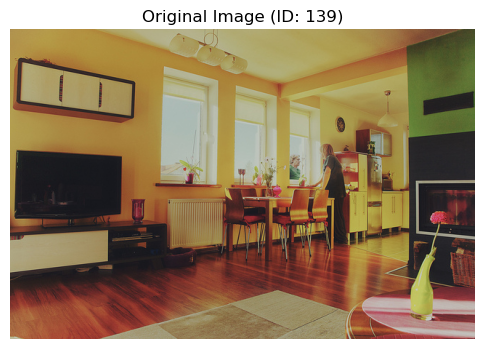


Visualizing 'Backbone Early Stage' feature map. Shape: torch.Size([1, 160, 25, 38])


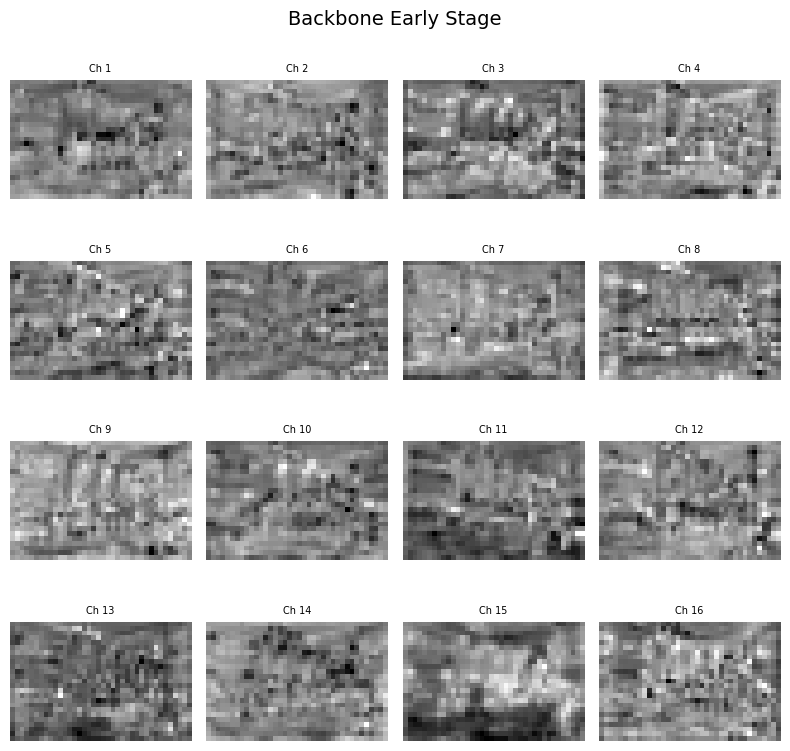


Visualizing 'Backbone Middle Stage' feature map. Shape: torch.Size([1, 960, 25, 38])


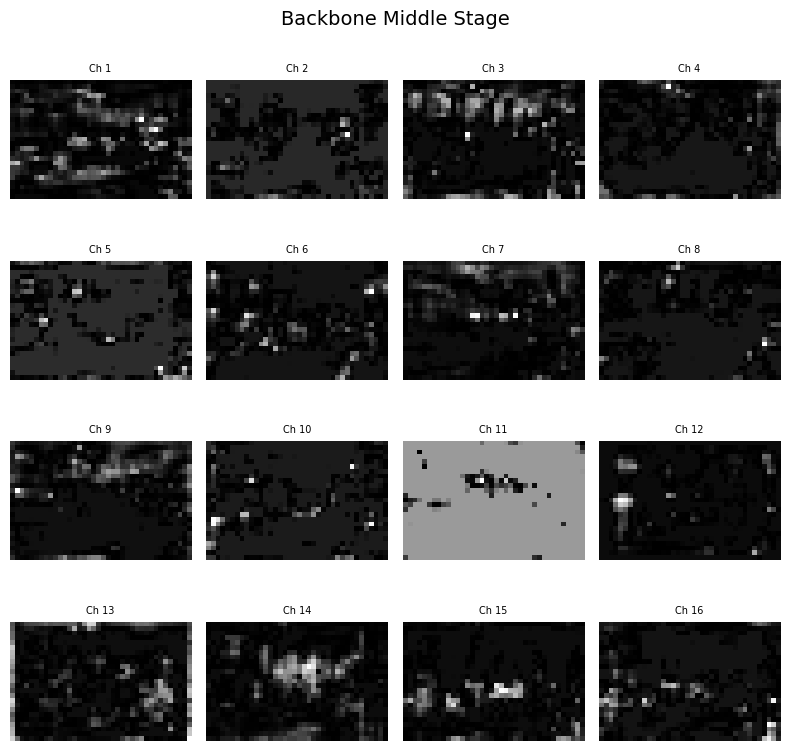


Visualizing 'FPN Output' feature map. Shape: torch.Size([1, 256, 25, 38])


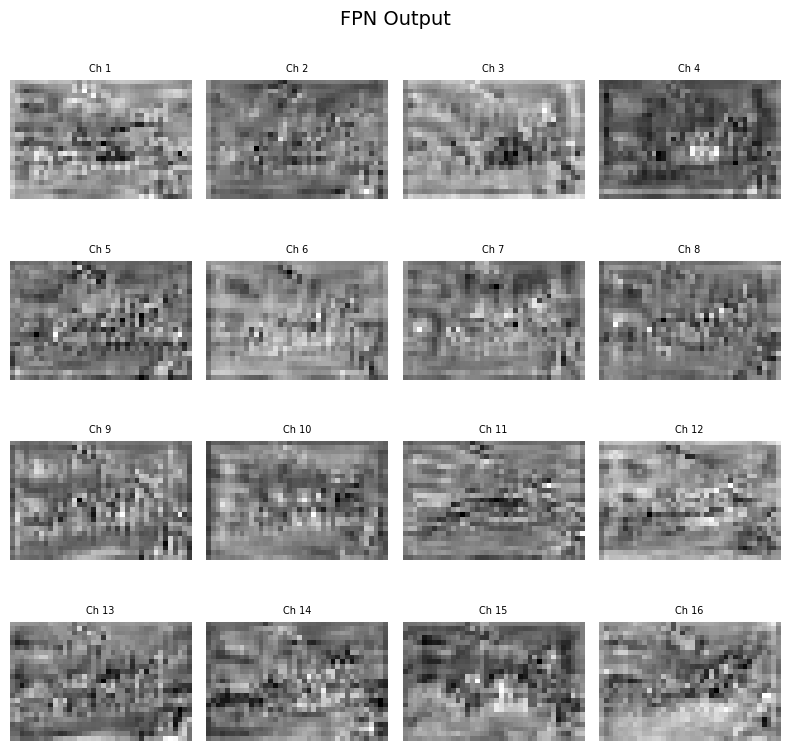

In [172]:
# --- Call the Feature Map Visualization ---
# Choose a good sample image ID from your COCO validation set.
# Pick one that has diverse objects or a clear scene.
# You can also pick a random one: random.choice(coco_gt_eval.getImgIds())
# -------- 4. RUN --------
sample_image_id_for_viz = 139  # Pick any valid COCO image ID
visualize_feature_maps(
    model=model_rcnn,
    sample_image_id=sample_image_id_for_viz,
    image_dir=coco_val_image_dir,
    preprocess_transform=rcnn_preprocess_transform,
    device=device,
    coco_gt_obj=coco_gt_eval
)

# Code to Import or Export predictions

In [89]:
import json
import os # For path manipulation

# Assuming rcnn_coco_predictions is already available in your current session
# and Google Drive is mounted at /content/drive/MyDrive

# Define the folder on your Google Drive where you want to save
output_dir = r'C:\Users\pc\Desktop\Term 10\Computer Vision\Assignment 4 Part 2\predictions'
os.makedirs(output_dir, exist_ok=True) # Create the directory if it doesn't exist

# Define the filename for the Faster R-CNN COCO predictions
rcnn_output_filename = os.path.join(output_dir, 'ssd_voc_predictions_chosen_score.json')

print(f"Saving Faster R-CNN COCO predictions to: {rcnn_output_filename}...")
serializable_predictions = []
for pred_per_image in ssd_voc_predictions_chosen_score:
    serializable_pred = pred_per_image.copy() # Make a shallow copy of the dict
    if 'boxes' in serializable_pred and isinstance(serializable_pred['boxes'], np.ndarray):
        serializable_pred['boxes'] = serializable_pred['boxes'].tolist() # Convert numpy array to list
    if 'labels' in serializable_pred and isinstance(serializable_pred['labels'], np.ndarray):
        serializable_pred['labels'] = serializable_pred['labels'].tolist() # Convert numpy array to list
    if 'scores' in serializable_pred and isinstance(serializable_pred['scores'], np.ndarray):
        serializable_pred['scores'] = serializable_pred['scores'].tolist() # Convert numpy array to list
    serializable_predictions.append(serializable_pred)
# Save the list of dictionaries to a JSON file
# Use 'indent=4' for pretty-printing, makes it human-readable
# Use 'default=float' to handle numpy floats (if any remain, though .cpu().numpy() usually converts)
with open(rcnn_output_filename, 'w') as f:
    json.dump(serializable_predictions, f, indent=4)

print("Predictions saved successfully!")

Saving Faster R-CNN COCO predictions to: C:\Users\pc\Desktop\Term 10\Computer Vision\Assignment 4 Part 2\predictions\ssd_voc_predictions_chosen_score.json...
Predictions saved successfully!


In [12]:
import json
import os
import numpy as np # Needed if you convert loaded lists back to numpy arrays later

# Make sure Google Drive is mounted if you're starting a new session
# from google.colab import drive
# drive.mount('/content/drive')

# Define the path to the saved predictions file
output_dir = r'C:\Users\pc\Desktop\Term 10\Computer Vision\Assignment 4 Part 2\predictions'
def load_predictions(output_dir, filename):
    print(f"Loading COCO predictions from: {filename}...")
    
    # Load the predictions from the JSON file
    with open(os.path.join(output_dir, filename), 'r') as f:
        loaded_coco_predictions = json.load(f)
    
    # The 'boxes', 'labels', 'scores' inside each dictionary will be Python lists after loading.
    # If you need them back as NumPy arrays (e.g., for direct use with numpy operations or plotting),
    # you can convert them:
    for pred in loaded_coco_predictions:
        if 'boxes' in pred:
            pred['boxes'] = np.array(pred['boxes'])
        if 'labels' in pred:
            pred['labels'] = np.array(pred['labels'])
        if 'scores' in pred:
            pred['scores'] = np.array(pred['scores'])
    
    print("Predictions loaded successfully!")
    print(f"Number of loaded predictions (images): {len(loaded_coco_predictions)}")
    return loaded_coco_predictions
rcnn_pred_low = load_predictions(output_dir, 'rcnn_coco_predictions_low_score.json')
yolo_pred_low = load_predictions(output_dir, 'yolo_coco_predictions_low_score.json')
ssd_pred_low = load_predictions(output_dir, 'ssd_coco_predictions_low_score.json')
rcnn_pred_chosen = load_predictions(output_dir, 'rcnn_coco_predictions_chosen_score.json')
yolo_pred_chosen = load_predictions(output_dir, 'yolo_coco_predictions_chosen_score.json')
ssd_pred_chosen = load_predictions(output_dir, 'ssd_coco_predictions_chosen_score.json')
rcnn_pred_high = load_predictions(output_dir, 'rcnn_coco_predictions_high_score.json')
yolo_pred_high = load_predictions(output_dir, 'yolo_coco_predictions_high_score.json')
ssd_pred_high = load_predictions(output_dir, 'ssd_coco_predictions_high_score.json')

Loading COCO predictions from: rcnn_coco_predictions_low_score.json...
Predictions loaded successfully!
Number of loaded predictions (images): 5000
Loading COCO predictions from: yolo_coco_predictions_low_score.json...
Predictions loaded successfully!
Number of loaded predictions (images): 5000
Loading COCO predictions from: ssd_coco_predictions_low_score.json...
Predictions loaded successfully!
Number of loaded predictions (images): 5000
Loading COCO predictions from: rcnn_coco_predictions_chosen_score.json...
Predictions loaded successfully!
Number of loaded predictions (images): 5000
Loading COCO predictions from: yolo_coco_predictions_chosen_score.json...
Predictions loaded successfully!
Number of loaded predictions (images): 5000
Loading COCO predictions from: ssd_coco_predictions_chosen_score.json...
Predictions loaded successfully!
Number of loaded predictions (images): 5000
Loading COCO predictions from: rcnn_coco_predictions_high_score.json...
Predictions loaded successfully!
